 ![]( airbnb.jpg) 

<div class="alert alert-block alert-info">
<b><font size="4"> Importing the Necessary Libraries</font></b>
</div>

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
import warnings
warnings.filterwarnings('ignore')
import pandas_profiling# pip install pandas-profiling

<div class="alert alert-block alert-info">
<b><font size="4"> Data Acquisition & Exploration</font></b>
</div>

In [2]:
df = pd.read_csv('AB_NYC_2019.csv')

In [3]:
df.head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,2539,Clean & quiet apt home by the park,2787,John,Brooklyn,Kensington,40.64749,-73.97237,Private room,149,1,9,2018-10-19,0.21,6,365
1,2595,Skylit Midtown Castle,2845,Jennifer,Manhattan,Midtown,40.75362,-73.98377,Entire home/apt,225,1,45,2019-05-21,0.38,2,355
2,3647,THE VILLAGE OF HARLEM....NEW YORK !,4632,Elisabeth,Manhattan,Harlem,40.80902,-73.94190,Private room,150,3,0,NaN,NaN,1,365
3,3831,Cozy Entire Floor of Brownstone,4869,LisaRoxanne,Brooklyn,Clinton Hill,40.68514,-73.95976,Entire home/apt,89,1,270,2019-07-05,4.64,1,194
4,5022,Entire Apt: Spacious Studio/Loft by central park,7192,Laura,Manhattan,East Harlem,40.79851,-73.94399,Entire home/apt,80,10,9,2018-11-19,0.10,1,0


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48895 entries, 0 to 48894
Data columns (total 16 columns):
id                                48895 non-null int64
name                              48879 non-null object
host_id                           48895 non-null int64
host_name                         48874 non-null object
neighbourhood_group               48895 non-null object
neighbourhood                     48895 non-null object
latitude                          48895 non-null float64
longitude                         48895 non-null float64
room_type                         48895 non-null object
price                             48895 non-null int64
minimum_nights                    48895 non-null int64
number_of_reviews                 48895 non-null int64
last_review                       38843 non-null object
reviews_per_month                 38843 non-null float64
calculated_host_listings_count    48895 non-null int64
availability_365                  48895 non-null int64

In [24]:
df.shape

(48895, 16)

In [3]:
# display(df.profile_report(style={'full_width':True}))

###### The above code upon reopening may not display the output report, as we need to rerun the code again as it is expect behaviour

In [4]:
# profile = df.profile_report(title='Pandas Profiling Report')
# profile.to_file(output_file="datanalysis.html")# saving the profile report

From the above Reports we can see that almost all of the Variables are skewed which needs to be rectified for Regression tasks

<div class="alert alert-block alert-info">
<b><font size="4"> Exploratory Data Analysis</font></b>
</div>

In [76]:
#identifying insignificant Features
def coefpval(x,y):
    x=x[x.corr().columns]
    from scipy import stats
    ls=[]
    for i in range(x.shape[1]):
        ls.append(stats.pearsonr(x.iloc[:,i], y)  )
    copv=pd.DataFrame(ls,index=x.columns,columns= ['Pearson-Coeff','P-Value'])
    copv['P-Ind'] = pd.cut(copv['P-Value'], bins =[0, 0.001, 0.05,0.1, 1.0], labels=['Strong','Moderate','Weak','Insignificant'], include_lowest=True )
    copv['C-Ind'] = pd.cut(copv['Pearson-Coeff'], bins =[-1.0,0, 1.0], labels=['Negative','Positive'], include_lowest=True )
    
    return copv

# Function of multi-Correlation
def multicorrelation(data, threshold=0.80):
    col_corr = set()  # Set of all the names of deleted columns
    corr_matrix = data.corr()
    
    print('  \n    Correlation with more than :',threshold)
    print('\n\nCorr Value',"\t",'Fearture1', "\t\t\t\t", 'Feature 2')
    for i in range(len(corr_matrix.columns)):
        for j in range(i):
            if (abs(corr_matrix.iloc[i, j]) >= threshold) and (corr_matrix.columns[j] not in col_corr):
                print(f'{corr_matrix.iloc[i, j].round(5):<{16}} {corr_matrix.columns[i]:{39}} {corr_matrix.columns[j]:{40}}')
                     
    print('\n\n The above mentioned correlations only are present in the given Dataset')

### Relationship between Numerical(Continuous) variables and the Target variable

In [38]:
x=df.dropna().drop('price',axis=1)
y= df.dropna()['price']

In [39]:
display(coefpval(x,y))

,Pearson-Coeff,P-Value,P-Ind,C-Ind
id,-0.006696,1.870667e-01,Insignificant,Negative
host_id,0.006263,2.172186e-01,Insignificant,Positive
latitude,0.031344,6.529758e-10,Strong,Positive
longitude,-0.155298,4.228450e-208,Strong,Negative
minimum_nights,0.025501,5.030048e-07,Strong,Positive
number_of_reviews,-0.035924,1.438829e-12,Strong,Negative
reviews_per_month,-0.030623,1.591501e-09,Strong,Negative
calculated_host_listings_count,0.052895,1.831175e-25,Strong,Positive
availability_365,0.078276,8.034109e-54,Strong,Positive


From the above results we can see that the `id` and `host_id` are insignificant relationship with the Target variable `price`

In [77]:
multicorrelation(df,threshold=0.5)

  
    Correlation with more than : 0.5


Corr Value 	 Fearture1 				 Feature 2
0.58829          host_id                                 id                                      
0.54987          reviews_per_month                       number_of_reviews                       


 The above mentioned correlations only are present in the given Dataset


<div class="alert alert-block alert-success">
   and the correlation within Independent variables are lesser than 0.7 , hence we doesn't have to remove them
    <div>

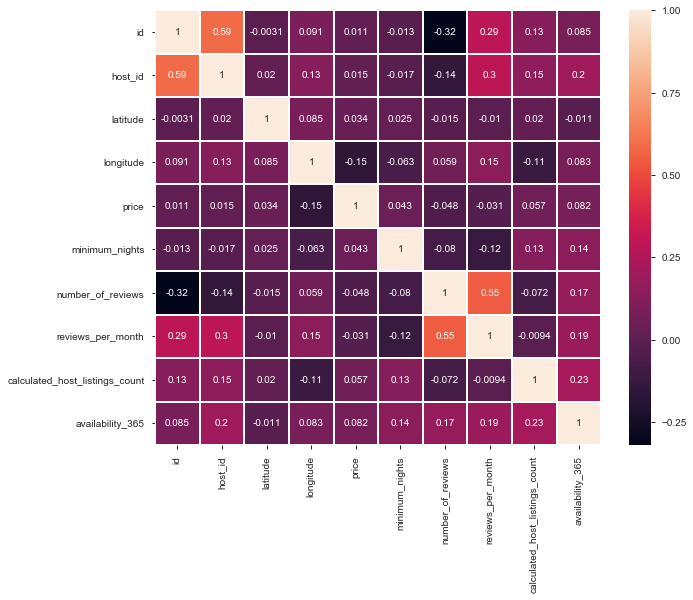

In [4]:
plt.figure(figsize=(10,8))
sns.heatmap(df.corr(),linecolor='white',linewidths=1,annot=True)


<Figure size 3000x2000 with 0 Axes>

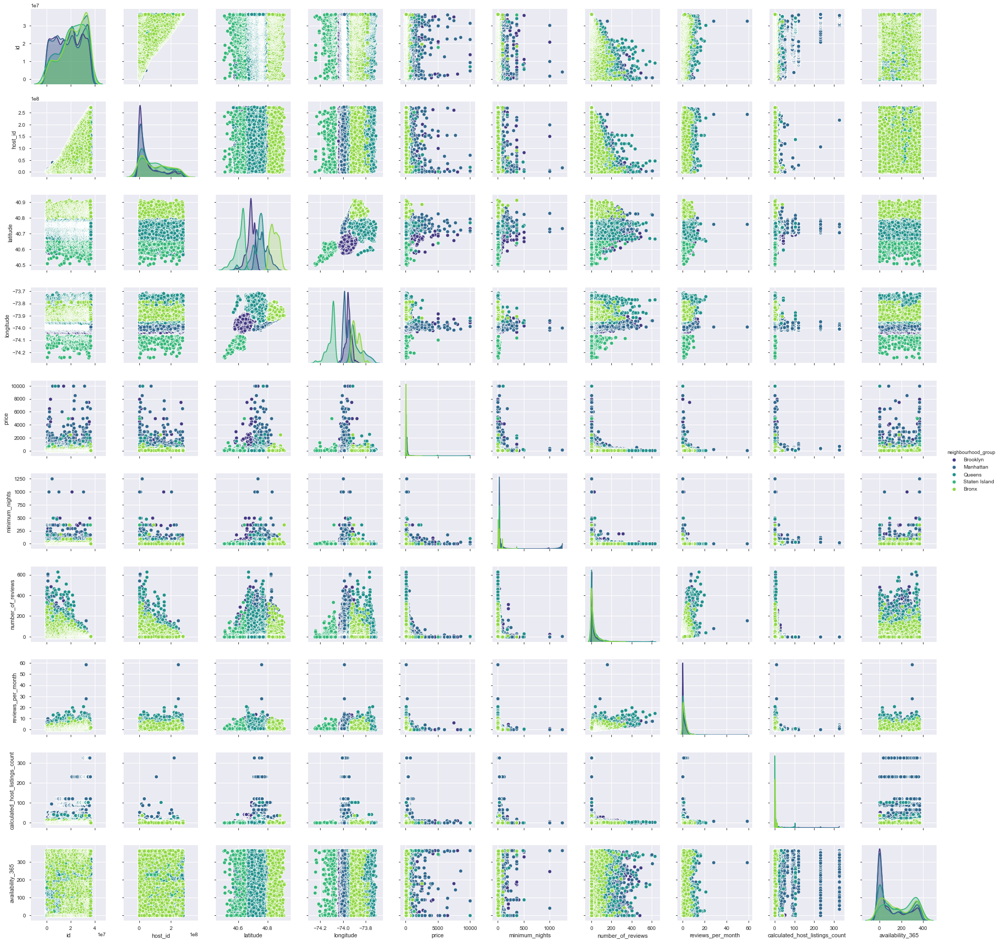

In [84]:
plt.figure(dpi=500)
sns.pairplot(df,hue='neighbourhood_group',palette='viridis')

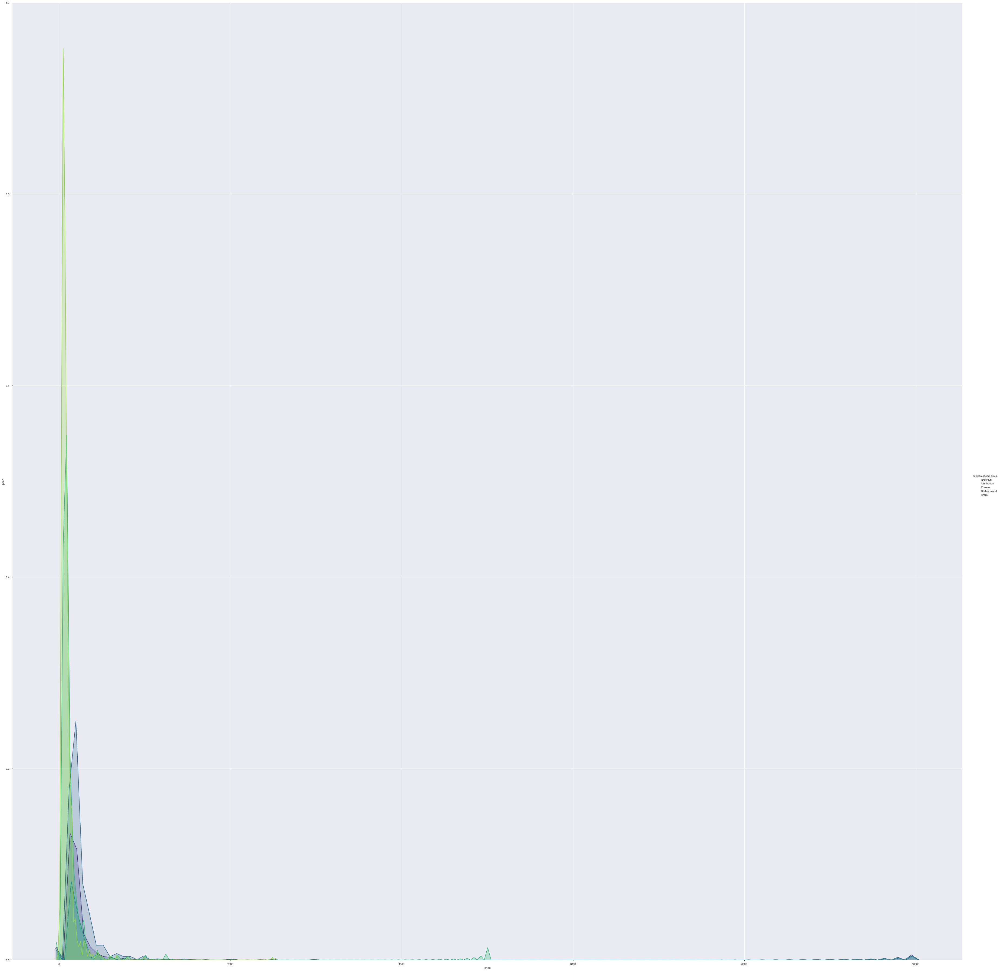

In [106]:
sns.pairplot(x_vars='price',y_vars='price',data=df,hue='neighbourhood_group',palette='viridis',size =50)

<div class="alert alert-block alert-success">

From the above plots we can see that the `price` distribution(target variable) is heavily skewed towards right(positive) and the `neighbourhood_group` variable is not seperating the price distribution well as it overlaps on each other. Lets examine the same through violin plot to get to know about the avearge price of rent based on `neighbourhood_group` down the road.   

Now, we will explore about the `neighbourhood_group` and `neighbourhood` to understand the dataset
</div>

<div class="alert alert-block alert-success">





The New York City encompasses Five county-level administrative divisions called `"Boroughs"`: 
1. Bronx 
2. Brooklyn
3. Manhattan
4. Queens
5. Staten Island  
Each borough is coterminous with a respective county of New York State

Reference: https://en.wikipedia.org/wiki/Boroughs_of_New_York_City
<div>

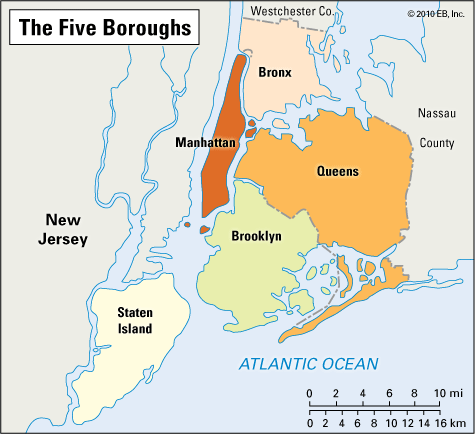


• The number of unique neighbourhood_group in dataset is :

 Manhattan        21661
Brooklyn         20104
Queens            5666
Bronx             1091
Staten Island      373
Name: neighbourhood_group, dtype: int64


• The Number of unique neighbourhood is :  221 



,Unique_neighborhood,Total number of Airbnb Listings
neighbourhood_group,,
Bronx,48,1091
Brooklyn,47,20104
Manhattan,32,21661
Queens,51,5666
Staten Island,43,373


	     Total		 221    		 48895


In [241]:
from IPython.display import Image
display(Image("5 boroughs.gif"))
print('\n• The number of unique neighbourhood_group in dataset is :\n\n',df['neighbourhood_group'].value_counts())
print('\n\n• The Number of unique neighbourhood is : ',df['neighbourhood'].nunique(),'\n')
one=pd.DataFrame(df[['neighbourhood_group','neighbourhood']].groupby(['neighbourhood_group']).nunique())
two=pd.DataFrame(df[['neighbourhood_group','neighbourhood']].groupby(['neighbourhood_group']).count())
two.rename(columns={'neighbourhood':'n2'},inplace=True)
three= pd.concat([one,two],axis=1)
three.drop('neighbourhood_group',axis=1,inplace=True)
three.rename(columns={'neighbourhood':'Unique_neighborhood','n2':'Total number of Airbnb Listings'},inplace=True)
display(three)
print('\t     Total\t\t',np.sum(48+47+32+51+43),'   \t\t',np.sum(1091+20104+21661+5666+373))

<div class="alert alert-block alert-success">
And each `neighbourhood_group`(boroughs) has been drilled down into fine locations as `neighbourhood` whose count is 221. Among the neighbourhood groups:     



1. `'Queens'` borough have highest number of unique neighbourhood locations(`51`) but less number of Airbnb listings(`5666` - rental places),which indicates that the Queens is not much popular site therefore less tourists and less rental spaces.Hence we can expect a low average rental price for this borough            



2. `'Manhattan'` have least number of unique neighbourhood locations(`32`) but have the maximum number of Airbnb listings(highest-`21,661`) in the entire state, which means that this is a popular site, thus more travelers and tourists and thus the large number of rental places. Therefore we can expect that the average rental price to be higher than the other boroughs
      
      
3. `Brooklyn` have the third highest number of unique neighbourhood locations(`47`) and also have the maximum number of Airbnb listings(2nd highest-`20,104`) in the entire state , which means that this site is also as popular as Manhattan. Therefore we can expect that the average rental price to be higher than the other boroughs but as same as Manhattan borough                 


4. `Bronx` have the second highest number of unique neighbourhood locations(`48`) but have the less number of Airbnb listings(`1,091`) , which means that this site is less popular. Hence we can expect a low average rental price for this borough                


5. `Staten Island` the fourth highest number of unique neighbourhood locations(`43`) but have very very less number of Airbnb listings(`373`) , which means that this site is not popular at all. Hence we can expect a low average rental price for this borough           



We can see that the number of Airbnb Listings in each borough is what influences the price and there are more number of Airbnb listing in Manhattan and Brooklyn, lets visualize the same below one by one using scatterplot & Heatmap 


<div>


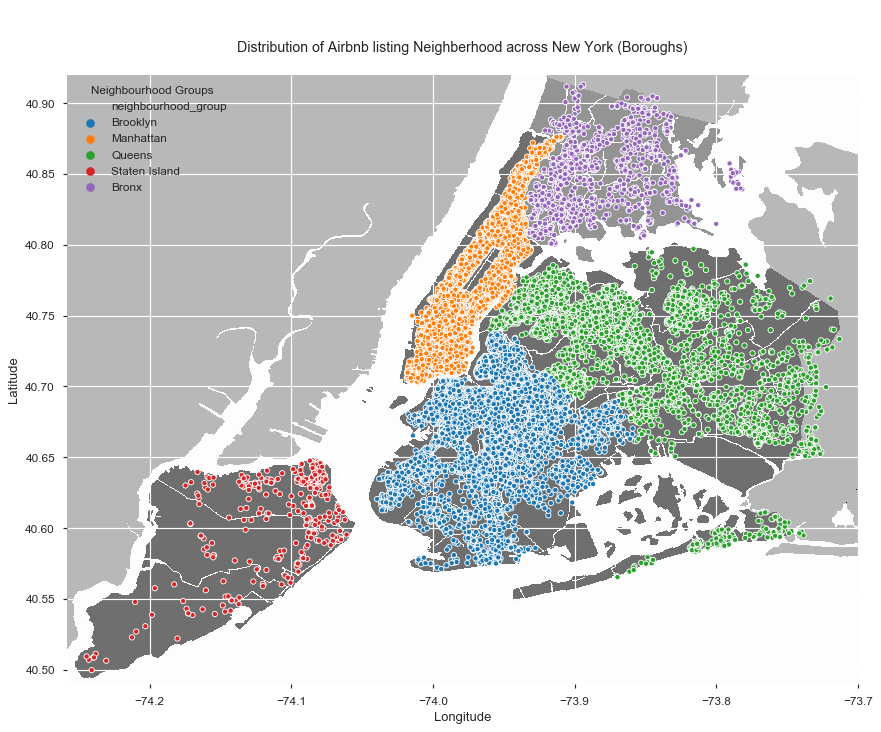

In [62]:
fig, ax = plt.subplots(figsize=(12,12),dpi =85)
img=plt.imread('New_York_City_.png', 0)# importing the Background image
coordenates_to_extent = [-74.258, -73.7, 40.49, 40.92]
ax.imshow(img, zorder=0, extent=coordenates_to_extent)
nymap = sns.scatterplot(x='longitude', y='latitude', hue='neighbourhood_group',s=20, ax=ax, data=df)
nymap.set(xlabel='Longitude', ylabel='Latitude', title='\n\nDistribution of Airbnb listing Neighberhood across New York (Boroughs)\n')
ax.grid(True)
plt.legend(title='Neighbourhood Groups')
plt.show()

In [ ]:
# pip install folium

In [5]:
import folium 
import folium.plugins
map = folium.Map([40.7128,-74.0060],zoom_start=11)
folium.plugins.HeatMap(df[['latitude','longitude']].dropna(),radius=8, gradient={0.2:'blue',0.4:'purple',0.6:'orange',1.0:'red'}).add_to(map)
display(map)
plt.show()

Please rerun the above code as it connects with live data from web every time when we reopen the notebook (the same results has been pasted in the presentation for reference)

<div class="alert alert-block alert-warning">

From the above spatial analysis, it is evident that there are a lot of Airbnb listings(rental spaces) in both `Manhattan` & `Brooklyn`and very very less Airbnb listings in `Staten Island` as per our Data Analysis.


Lets visualize the Price Distribution of Airbnb listings based on neighborhood_group(boroughs) to verify the above insight
<div>

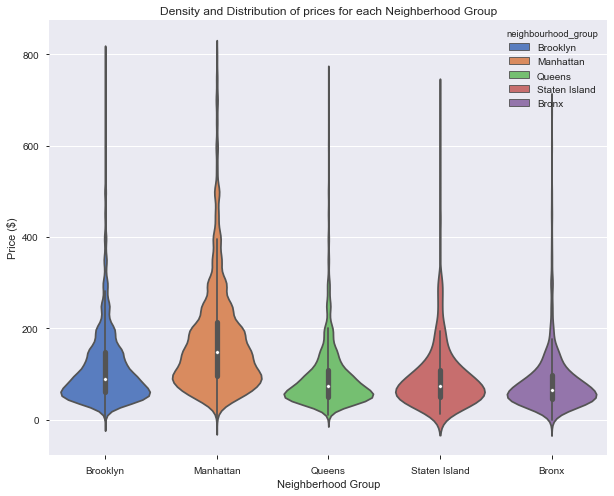



The Average price of each Boroughs :


,Average-Price
neighbourhood_group,
Bronx,87.496792
Brooklyn,124.383207
Manhattan,196.875814
Queens,99.517649
Staten Island,114.812332


In [15]:
plt.figure(figsize=(10,8))
vplot=sns.violinplot( x="neighbourhood_group", y="price",hue="neighbourhood_group", data=df[df['price'] < 800], palette="muted", dodge=False)
vplot.set(xlabel='Neighberhood Group', ylabel='Price ($)', title='Density and Distribution of prices for each Neighberhood Group')
plt.show()
avgprice= pd.DataFrame((df[['neighbourhood_group','price']].groupby(['neighbourhood_group']).mean()))
avgprice.rename(columns={'price':'Average-Price'},inplace=True)
print('\n\nThe Average price of each Boroughs :')
display(avgprice)

<div class="alert alert-block alert-success">


From above we can see that the average price of rent is same for `Queens`,`StateIsland` and `Bronx` and we can notice that the rent is highly overpriced in `Manhattan` and `Brooklyn` neighborhood group(boroughs), with the majority of density in prices between `200$ - 400$ `<br> <br>

Let's Visualize the same in the world map with heatmap representing the price, where we can verify that the most expensive airbnbs are in Manhattan borough. The rest of boroughs are regularly proportionate and all of them have the about same price.
<div>

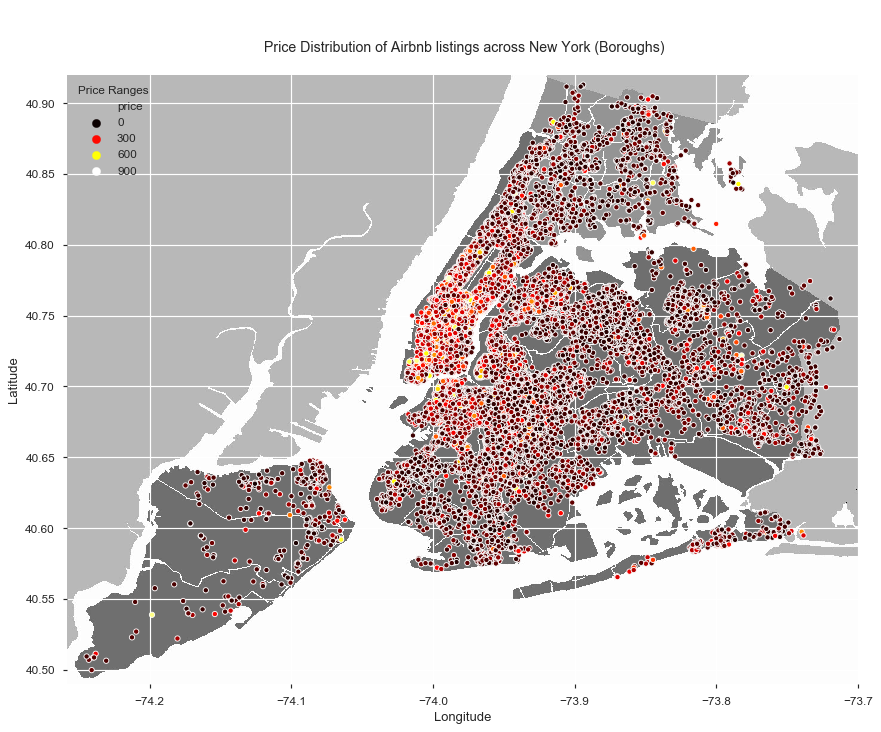

In [6]:
fig, ax = plt.subplots(figsize=(12,12),dpi =85)
img=plt.imread('New_York_City_.png', 0)# importing the Background image
coordenates_to_extent = [-74.258, -73.7, 40.49, 40.92]
ax.imshow(img, zorder=0, extent=coordenates_to_extent)
nymap = sns.scatterplot(x=df[df['price']<800]['longitude'], y=df[df['price']<800]['latitude'], hue=df[df['price']<800]['price'] ,s=20, 
                        ax=ax, data=df,palette='hot')
nymap.set(xlabel='Longitude', ylabel='Latitude', title='\n\n Price Distribution of Airbnb listings across New York (Boroughs)\n')
ax.grid(True)
plt.legend(title='Price Ranges',loc='upper left')
plt.show()

<div class="alert alert-block alert-warning">

From the above spatial analysis it is evident that the most priced Airbnb listings are located in `'Manhattan'` & `'Brooklyn'` and the rest of boroughs are regularly proportionate and all of them have the about same price.
<div>

<div class="alert alert-block alert-success">
Among all the neighborhoods (Airbnb listings-221), which neighborhood is the most popular ones(frequency of names in the dataset) by    


 using Word cloud (if we simply use the value_counts() over the dataset we will be getting 221 rows of crunching numbers , hence we can    


visualize the same in wordcloud as the better form of representing the data).


Here we will be plotting the word cloud on the map of New York itself!
<div>

In [1]:
#pip install wordcloud

In [4]:
import wordcloud
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator

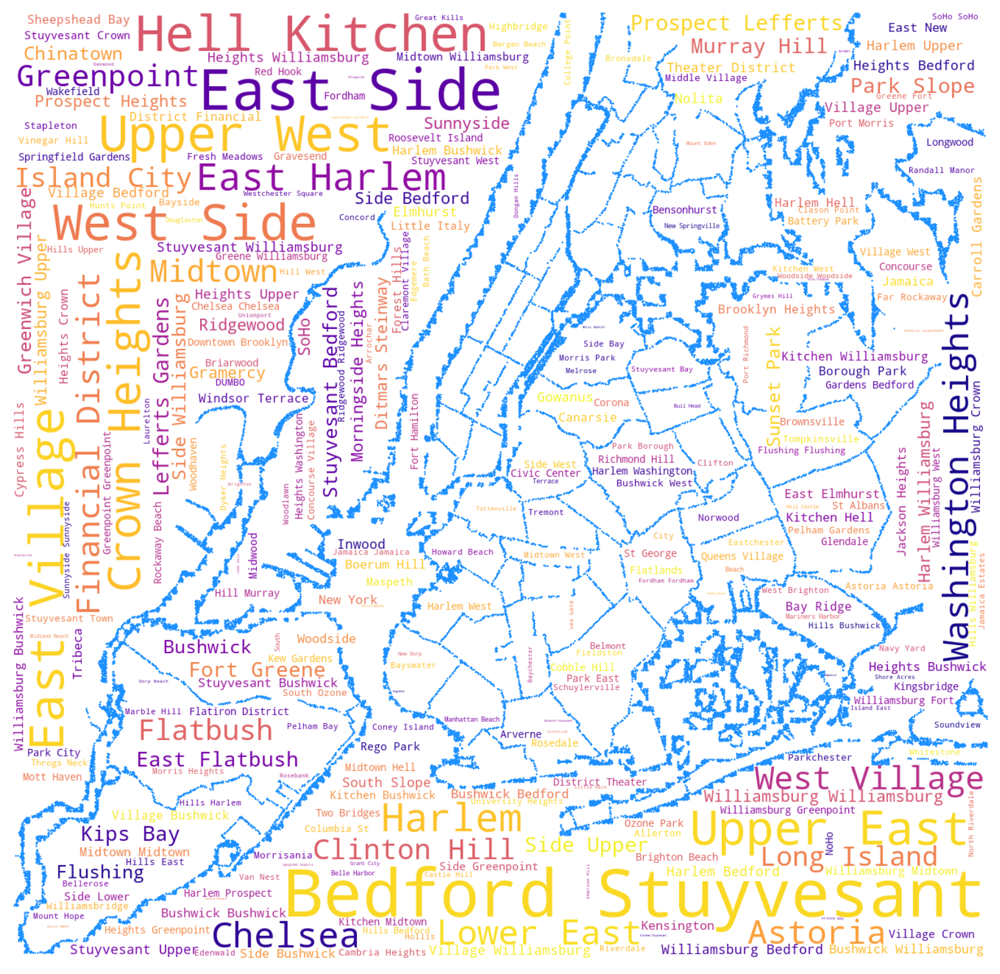

In [61]:
# Generate a word cloud image
wc = " ".join([neighbourhood for neighbourhood in df["neighbourhood"].dropna()])
stopwords = set(STOPWORDS) #setting the stop words
mask = np.array(Image.open("New_York_City_.png"))
wordcloud_por = WordCloud(stopwords=stopwords, background_color="white", max_words=1000, mask=mask,colormap="plasma",contour_width=3, contour_color='dodgerblue').generate(wc)
plt.figure(figsize=(10,10),dpi=200)
plt.imshow(wordcloud_por, interpolation="bilinear")
plt.axis("off")
plt.show()


<div class="alert alert-block alert-success">
    <b>Let's analyze the other categorical features</b>             





There are 3 types of Rooms avaiable in the above mentioned neighborhoods(221) which are `'Entire home/apt'` , `'Private room'` & `'Shared room'`, let's visualize the dataset and verify how much availablity is there in each type of rooms and also
 how much rooms are available in each type in each neighborhood_groups(boroughs) 

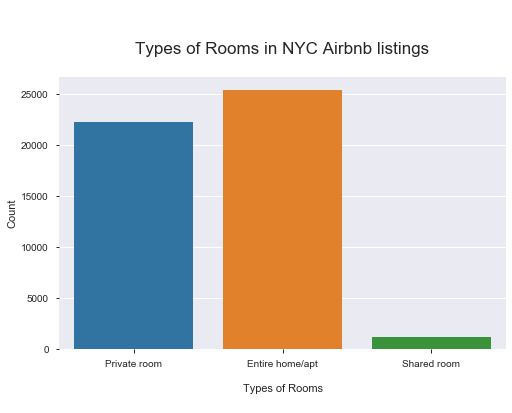

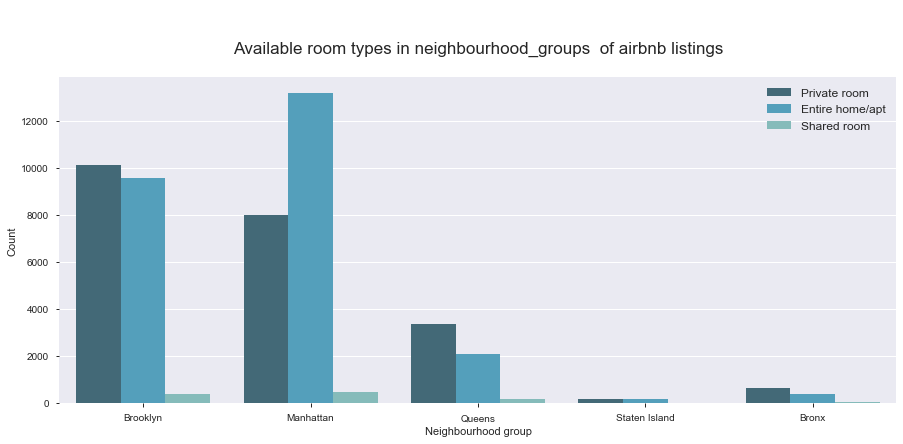

In [33]:
plt.figure(figsize=(8,5))
sns.countplot(df['room_type'])
plt.title('\n\nTypes of Rooms in NYC Airbnb listings\n', fontsize=17)
plt.xlabel('\nTypes of Rooms\n')
plt.ylabel("Count")
plt.show()
plt.figure(figsize=(15,6))
sns.countplot(data=df, x='neighbourhood_group', hue='room_type', palette='GnBu_d')
plt.title('\n\nAvailable room types in neighbourhood_groups  of airbnb listings\n', fontsize=17)
plt.xlabel('Neighbourhood group')
plt.ylabel("Count")
plt.legend(frameon=False, fontsize=12)
plt.show()

<div class="alert alert-block alert-success">

From above we can see than by default we have only less number of Shared rooms as usually the travelers and tourists prefer to have a space for them without any disturbances, therefore Entire home/apt & Private type of rooms are more popular and more availability.<br>
    <br>
and also by default we won't have much neighborhoods locations(Airbnb listings) in `'Sataten Island'` and `'Bronx'`in the first place,hence we will be having less no of rooms in all categories. likewise we have more number of neighborhoods locations in both `'Manhattan'` & `'Brooklyn'`, but the ratio of the rooms in each boroughs will be almost the same<br>
<br>
Let's visualize the room types in the map and verify whether the `'Manhattan'` and `'Brooklyn'` has more number of Entire home/apt and Private rooms
<div>

In [60]:
display(df[['neighbourhood_group','room_type','id']].groupby(['neighbourhood_group','room_type']).count())

id
neighbourhood_group room_type             
Bronx               Entire home/apt    379
                    Private room       652
                    Shared room         60
Brooklyn            Entire home/apt   9559
                    Private room     10132
                    Shared room        413
Manhattan           Entire home/apt  13199
                    Private room      7982
                    Shared room        480
Queens              Entire home/apt   2096
                    Private room      3372
                    Shared room        198
Staten Island       Entire home/apt    176
                    Private room       188
                    Shared room          9

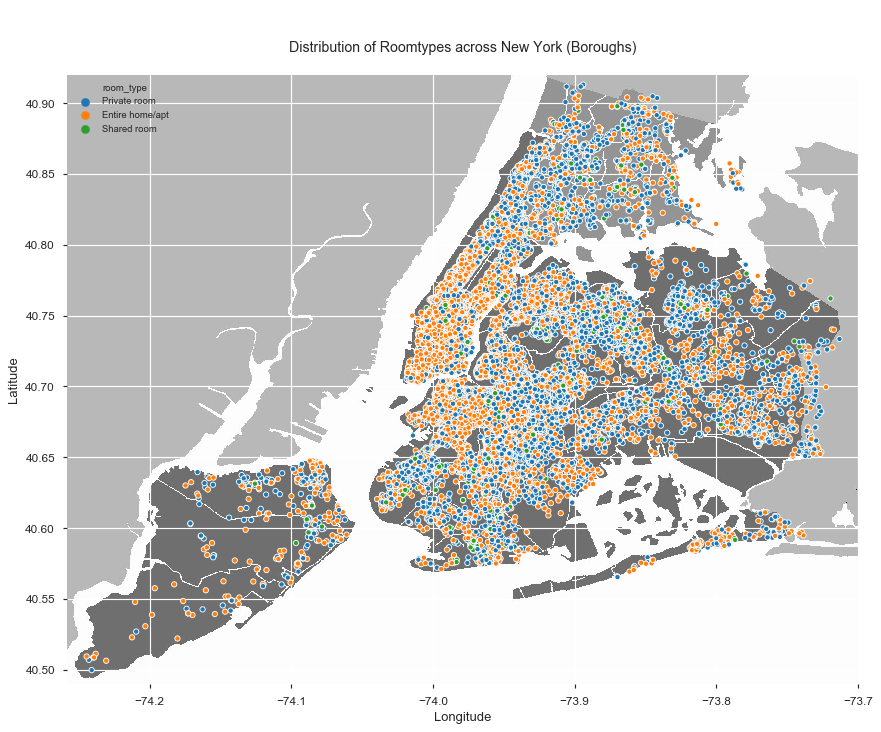

In [58]:
fig, ax = plt.subplots(figsize=(12,12),dpi=85)
img=plt.imread('New_York_City_.png', 0)# importing the Background image
coordenates_to_extent = [-74.258, -73.7, 40.49, 40.92]
ax.imshow(img, zorder=0, extent=coordenates_to_extent)
nymap = sns.scatterplot(x='longitude', y='latitude', hue='room_type',s=20, ax=ax, data=df)
nymap.set(xlabel='Longitude', ylabel='Latitude', title='\n\nDistribution of Roomtypes across New York (Boroughs)\n')
ax.grid(True)
plt.legend(fontsize=8, loc='upper left')
plt.show()

<div class="alert alert-block alert-success">

From the above spatial analysis we can see that the `'Manhattan'` has more number of `'Entire home/apt'`(orange) compared with `'Private rooms'`
and the `'Brooklyn'` has more number of `'Private Rooms'`(blue) than `'Entire home/apt'`
    <div>

<div class="alert alert-block alert-warning">
    Let's explore the availability of the same rooms based on `neighbourhood_groups` (boroughs)
    <div>

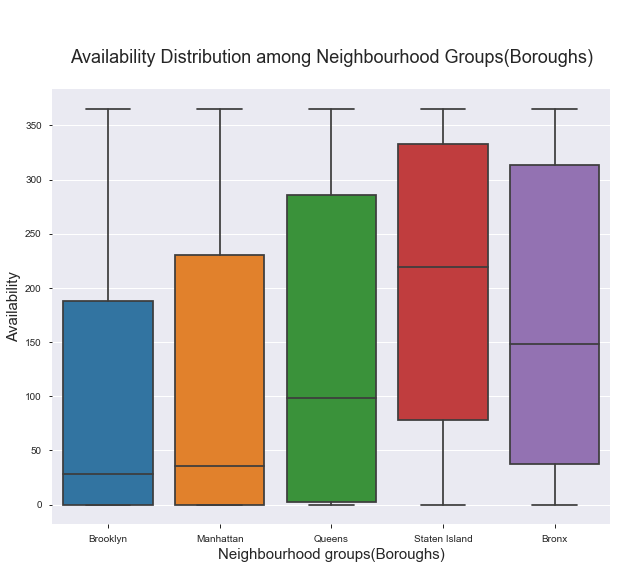

In [5]:
plt.figure(figsize=(10,8))
sns.boxplot(x='neighbourhood_group',y='availability_365',data=df)
plt.xlabel('Neighbourhood groups(Boroughs)',fontsize=15)
plt.ylabel('Availability',fontsize=15)
plt.title('\n\nAvailability Distribution among Neighbourhood Groups(Boroughs)\n',fontsize=18)
plt.show()

<div class="alert alert-block alert-success">

From above we can see that there are less availability in the `Manhattan` and `Brooklyn` and there are more availability in `Bronx` and `Staten Island`, let's visualize the same on map
    <div>

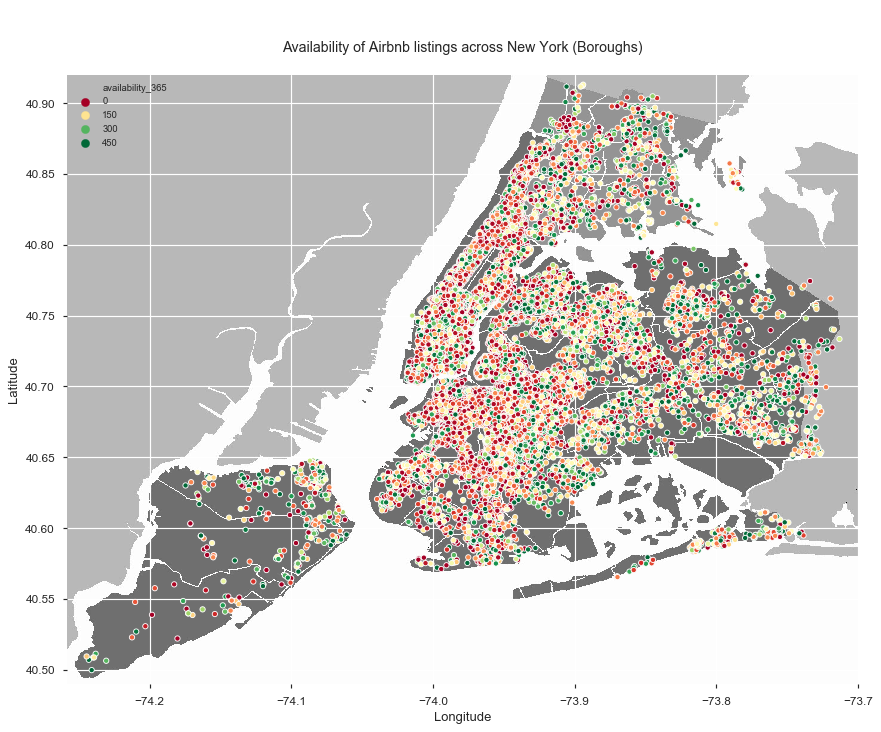

In [3]:
fig, ax = plt.subplots(figsize=(12,12),dpi=85)
img=plt.imread('New_York_City_.png', 0)# importing the Background image
coordenates_to_extent = [-74.258, -73.7, 40.49, 40.92]
ax.imshow(img, zorder=0, extent=coordenates_to_extent)
nymap = sns.scatterplot(x='longitude', y='latitude', hue='availability_365',s=20, ax=ax, data=df,palette='RdYlGn')
nymap.set(xlabel='Longitude', ylabel='Latitude', title='\n\nAvailability of Airbnb listings across New York (Boroughs)\n')
ax.grid(True)
plt.legend(fontsize=8, loc='upper left')
plt.show()

<div class="alert alert-block alert-success">
    In the above plot, Red dots represents less availability of rooms (throughout a year) and Green dots represents more availability.  <br>   <br>     

We can notice that the boroughs like `'Manhattan'` and `'Brooklyn'` are having less availability of rooms due to its Popularity and on the other hand
the boroughs `'Bronx'` and `'Queens'` have more availability of rooms as because its less popular than the above 2 boroughs.
<div>

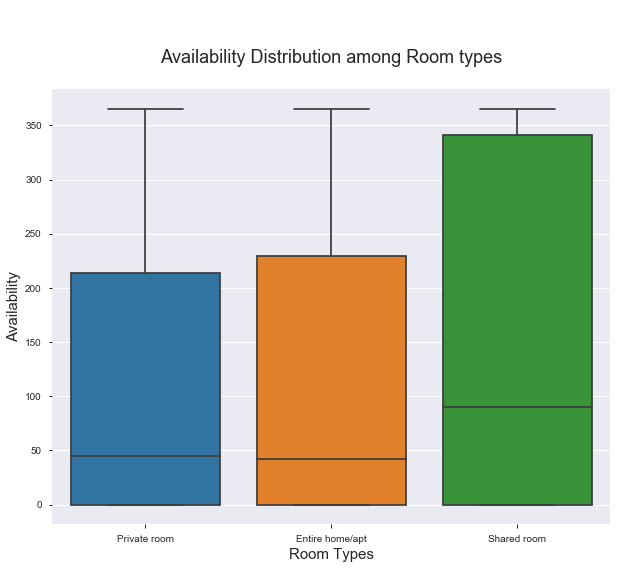

In [3]:
plt.figure(figsize=(10,8))
sns.boxplot(x='room_type',y='availability_365',data=df)
plt.xlabel('Room Types',fontsize=15)
plt.ylabel('Availability',fontsize=15)
plt.title('\n\nAvailability Distribution among Room types\n',fontsize=18)
plt.show()

<div class="alert alert-block alert-success">
From above we can see that there is less availability in Private rooms and more availability in shared rooms<br><br>
Let's see how many rooms are available in each type in each neighbourhoods with average availability of each rooms

In [15]:
a=pd.DataFrame(df[['neighbourhood_group','room_type','id']]
               .groupby(['neighbourhood_group','room_type']).count())
a.rename(columns={'id':'Number of Rooms'},inplace=True)
b=pd.DataFrame(df[['neighbourhood_group',
                   'room_type','availability_365']]
               .groupby(['neighbourhood_group','room_type']).mean())
b.rename(columns={'availability_365':'Average availability'},inplace=True)
c=pd.concat([a,b['Average availability']],axis=1)
display(c)

Number of Rooms  Average availability
neighbourhood_group room_type                                             
Bronx               Entire home/apt              379            158.000000
                    Private room                 652            171.331288
                    Shared room                   60            154.216667
Brooklyn            Entire home/apt             9559             97.205147
                    Private room               10132             99.917983
                    Shared room                  413            178.007264
Manhattan           Entire home/apt            13199            117.140996
                    Private room                7982            101.845026
                    Shared room                  480            138.572917
Queens              Entire home/apt             2096            132.267176
                    Private room                3372            149.222716
                    Shared room                  198            192.186869
Staten Island       Entire home/apt              176            178.073864
                    Private room                 188            226.361702
                    Shared room                    9             64.777778

<div class="alert alert-block alert-warning">
    Now, lets check the outliers of price (target variable)
    <div>

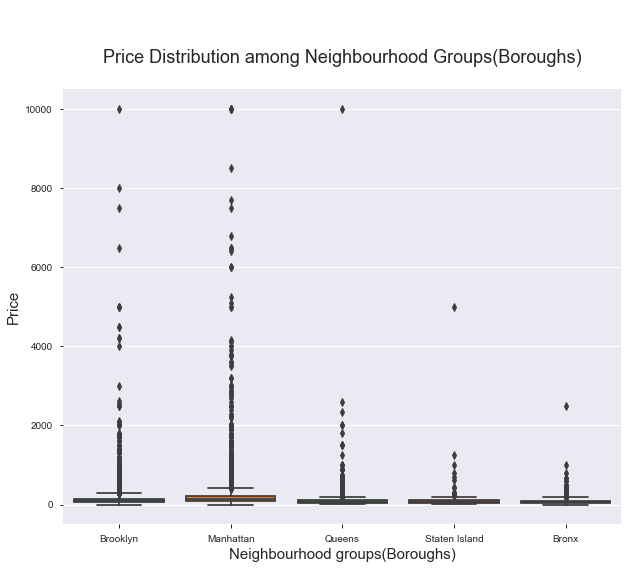

In [27]:
plt.figure(figsize=(10,8))
sns.boxplot(x='neighbourhood_group',y='price',data=df)
plt.xlabel('Neighbourhood groups(Boroughs)',fontsize=15)
plt.ylabel('Price',fontsize=15)
plt.title('\n\nPrice Distribution among Neighbourhood Groups(Boroughs)\n',fontsize=18)
plt.show()

From above we can see that there is a lot of outliers in the price variable, lets check its distribution

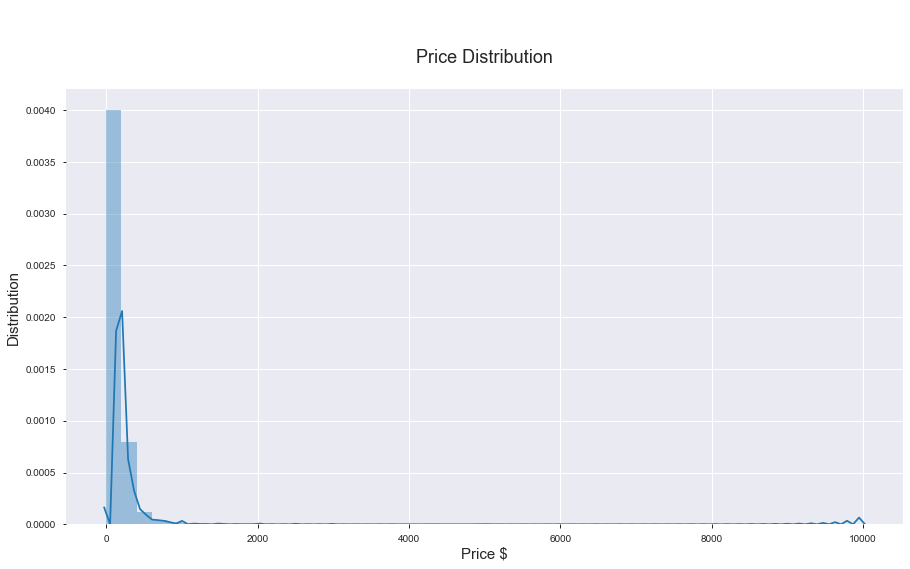

In [25]:
plt.figure(figsize=(15,8))
sns.distplot(df['price'])
plt.xlabel('Price $',fontsize=15)
plt.ylabel('Distribution',fontsize=15)
plt.title('\n\nPrice Distribution\n',fontsize=18)
plt.show()

<div class="alert alert-block alert-success">
    from above we can see that the price variable is heavily skewed towards right (whihc needs to be normalized). <br>     

Let's check whether the number of rating affect the price of Airbnb listings and check for any kind of relationship
<div>

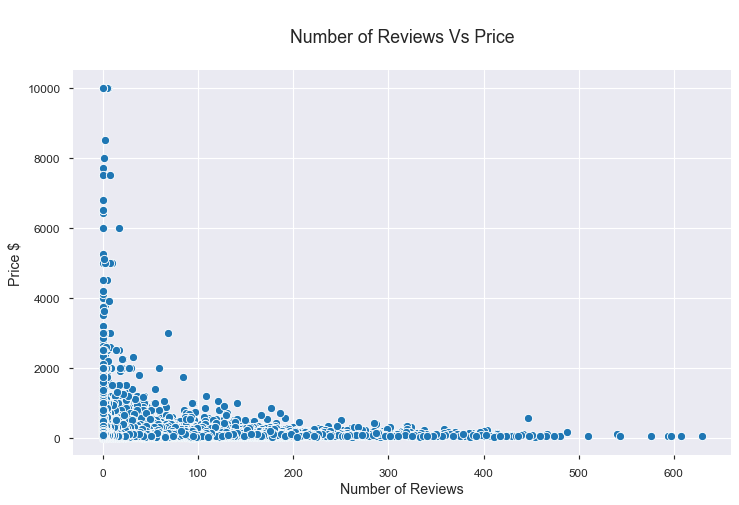

In [44]:
plt.figure(figsize=(10,6),dpi=85)
sns.scatterplot(x='number_of_reviews',y='price',data=df)
plt.xlabel('Number of Reviews',fontsize=12)
plt.ylabel('Price $',fontsize=12)
plt.title('\nNumber of Reviews Vs Price\n',fontsize=15)
plt.show()

<div class="alert alert-block alert-success">
    As most of our Airbnb locations have 0 reviews because they stay for minimum number of days but sometimes longer stay ends up with good reviews(its not guaranteed), thus we will be neglecting Number of reviews as it is not a good predictor of Price
    <div>

<div class="alert alert-block alert-info">
<b><font size="4"> Data Wrangling & Pre-Processing :</font></b>

1. Identify and handling missing values
2. Data Formatting (categorical to numerical, changing datatypes)
3. Categorical data transformation (One-Hot Encoding)
4. Duplicates Removal
5. Skewness
6. Outliers

<div>

In [6]:
display(pd.concat([df.isnull().sum().sort_values(ascending =False),((df.isnull().sum() / len(df))*100).sort_values(ascending = False)],axis = 1,keys = ['Total','Percent %']))

,Total,Percent %
reviews_per_month,10052,20.558339
last_review,10052,20.558339
host_name,21,0.042949
name,16,0.032723
availability_365,0,0.000000
calculated_host_listings_count,0,0.000000
number_of_reviews,0,0.000000
minimum_nights,0,0.000000
price,0,0.000000
room_type,0,0.000000


<div class="alert alert-block alert-warning">

From above we can see that the `last_review` and `reviews_per_month` are missing about 20% of the data, hence we will be replacing null values in the column `reviews_per_month` with '0' in the dataset(instead of dropping as its logic to conclude that if there aren't any guests for the corressponding location the number of reviews will drop to 0) but not for `last_review` as it indicates the just only the date of latest review(last) which won't be quite useful for Regression analysis.  <br>  <br>   

And we will also be dropping the features `id` , `name`,`host_name`,`host_id` and `last_review` as they possess insignificant relationship to the Target variable `price` and also these are textual data. Hence we will be dropping these features while modelling but for Exploratiry Data Analysis(EDA) we will make use of it to understand the dataset better.
<div>

In [7]:
#filling the NaN values with 0 for 'reviews_per_month' variable
df['reviews_per_month'].fillna(0,inplace=True)

In [8]:
df.drop(['id','name','host_id','host_name','last_review'],axis=1,inplace=True)

In [9]:
# for the rest of the variables we will just drop the NaN entries
df.dropna(inplace=True)

In [10]:
# Checking the shape of the dataset after dropping the NaN values
df.shape

(48895, 11)

In [79]:
df.isnull().sum()

neighbourhood_group               0
neighbourhood                     0
latitude                          0
longitude                         0
room_type                         0
price                             0
minimum_nights                    0
number_of_reviews                 0
reviews_per_month                 0
calculated_host_listings_count    0
availability_365                  0
dtype: int64

Now, all the NaN values are removed from the Dataframe

In [80]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 48895 entries, 0 to 48894
Data columns (total 11 columns):
neighbourhood_group               48895 non-null object
neighbourhood                     48895 non-null object
latitude                          48895 non-null float64
longitude                         48895 non-null float64
room_type                         48895 non-null object
price                             48895 non-null int64
minimum_nights                    48895 non-null int64
number_of_reviews                 48895 non-null int64
reviews_per_month                 48895 non-null float64
calculated_host_listings_count    48895 non-null int64
availability_365                  48895 non-null int64
dtypes: float64(3), int64(5), object(3)
memory usage: 4.5+ MB


<div class="alert alert-block alert-success">

As we can see that there are 3 categorical variables which needs to be one-hot encoded first for regression analysis as the model wont take any categorical values.<br><br>

1. `neighbourhood_group` contains only 5 unique values hence it can be one-hot encoded from 0 to 4    <br>                            


2. `neighbourhood` contains 221 unique values hence it cannot be transformed into one-hot encoding as it will create 221 more columns, but we don't have a choice because if we just transformed it into numerical values(without one-hot encoding) the reggression model will consider that a unit increase/decrease in neighbourhood will leads to some amount of increase/decrease in price, which is not a case here as these variable is categorical in nature<br>

3. `room_type` has only 3 unique values hence it can be one-hot encoded from 0 to 2<br>
<div>

In [11]:
df1= pd.get_dummies(df)
df1.head()

,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,neighbourhood_group_Bronx,neighbourhood_group_Brooklyn,...,neighbourhood_Williamsburg,neighbourhood_Willowbrook,neighbourhood_Windsor Terrace,neighbourhood_Woodhaven,neighbourhood_Woodlawn,neighbourhood_Woodrow,neighbourhood_Woodside,room_type_Entire home/apt,room_type_Private room,room_type_Shared room
0,40.64749,-73.97237,149,1,9,0.21,6,365,0,1,...,0,0,0,0,0,0,0,0,1,0
1,40.75362,-73.98377,225,1,45,0.38,2,355,0,0,...,0,0,0,0,0,0,0,1,0,0
2,40.80902,-73.94190,150,3,0,0.00,1,365,0,0,...,0,0,0,0,0,0,0,0,1,0
3,40.68514,-73.95976,89,1,270,4.64,1,194,0,1,...,0,0,0,0,0,0,0,1,0,0
4,40.79851,-73.94399,80,10,9,0.10,1,0,0,0,...,0,0,0,0,0,0,0,1,0,0


after one-hot encoding we will be having 237 columns

In [12]:
df1.shape

(48895, 237)

<div class="alert alert-block alert-success">
    Now lets check the skewness for the important variables alone and normalize it
    <div>

In [13]:
df1[['price','minimum_nights','calculated_host_listings_count','reviews_per_month','availability_365' ]].skew()

price                             19.118939
minimum_nights                    21.827275
calculated_host_listings_count     7.933174
reviews_per_month                  3.300723
availability_365                   0.763408
dtype: float64

<div class="alert alert-block alert-warning">
    Before normalization using logrithmic transformation
    <div>

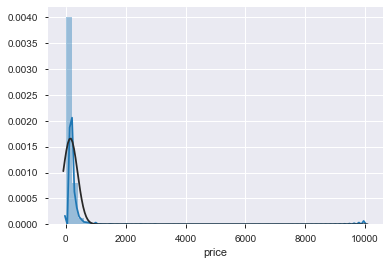

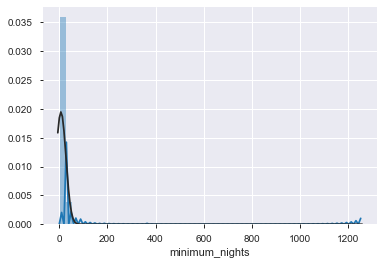

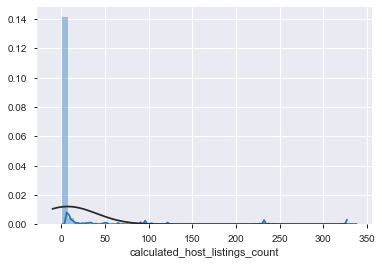

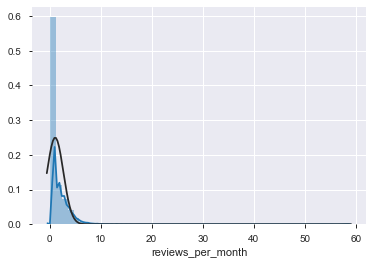

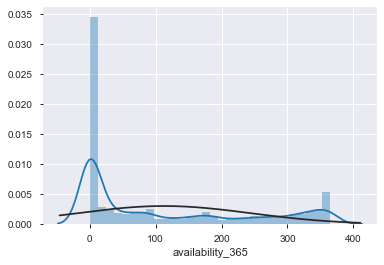

In [25]:
from scipy.stats import norm
for col in ['price','minimum_nights','calculated_host_listings_count','reviews_per_month','availability_365']:
    fig = plt.figure(figsize = (6,4))
    sns.distplot(df1[col], fit=norm);
    plt.xlabel(col)
    plt.show()

In [26]:
#applying log transformation
df1['log_price'] = np.log1p(df1['price'])
df1['log_minimum_nights'] = np.log1p(df1['minimum_nights'])
df1['log_calculated_host_listings_count'] = np.log1p(df1['calculated_host_listings_count'])
df1['log_reviews_per_month'] = np.log1p(df1['reviews_per_month'])
df1['log_availability_365'] = np.log1p(df1['availability_365'])

In [27]:
df1.head()

,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,neighbourhood_group_Bronx,neighbourhood_group_Brooklyn,...,neighbourhood_Woodrow,neighbourhood_Woodside,room_type_Entire home/apt,room_type_Private room,room_type_Shared room,log_price,log_minimum_nights,log_calculated_host_listings_count,log_reviews_per_month,log_availability_365
0,40.64749,-73.97237,149,1,9,0.21,6,365,0,1,...,0,0,0,1,0,5.010635,0.693147,1.945910,0.190620,5.902633
1,40.75362,-73.98377,225,1,45,0.38,2,355,0,0,...,0,0,1,0,0,5.420535,0.693147,1.098612,0.322083,5.874931
2,40.80902,-73.94190,150,3,0,0.00,1,365,0,0,...,0,0,0,1,0,5.017280,1.386294,0.693147,0.000000,5.902633
3,40.68514,-73.95976,89,1,270,4.64,1,194,0,1,...,0,0,1,0,0,4.499810,0.693147,0.693147,1.729884,5.273000
4,40.79851,-73.94399,80,10,9,0.10,1,0,0,0,...,0,0,1,0,0,4.394449,2.397895,0.693147,0.095310,0.000000


<div class="alert alert-block alert-warning">
    After Logrithmic transformation
    <div>

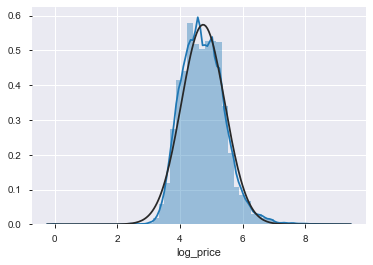

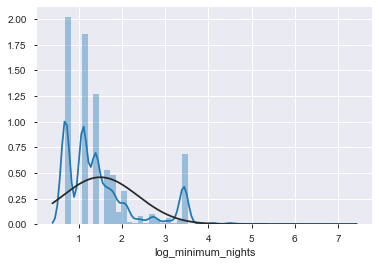

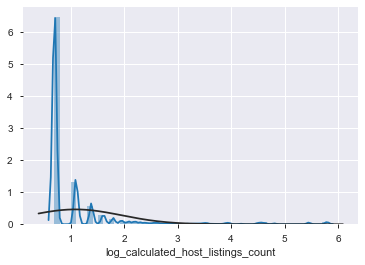

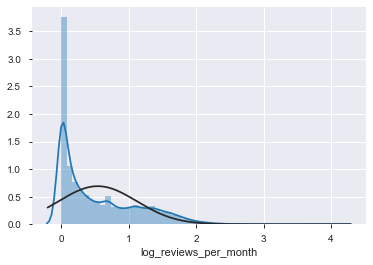

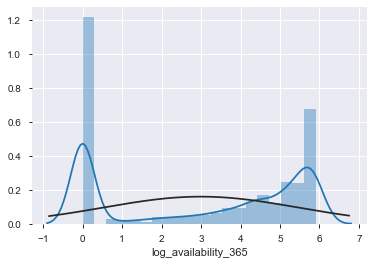

In [29]:
from scipy.stats import norm
for col in ['log_price','log_minimum_nights','log_calculated_host_listings_count','log_reviews_per_month','log_availability_365']:
    fig = plt.figure(figsize = (6,4))
    sns.distplot(df1[col], fit=norm);
    plt.xlabel(col)
    plt.show()

To deal with the outliers we will be using robust scaler(after the test train split) as it will nullify the effect of it

<div class="alert alert-block alert-info">
<b><font size="5"> Data Partitioning :</font></b>
    
Machine learning methods typically require splitting data into multiple chunks for training, validating, and finally testing for building and training a model
    <div>

In [39]:
df=df1.drop(['price','minimum_nights','calculated_host_listings_count','reviews_per_month','availability_365'],axis=1)


In [40]:
df.shape

(48895, 237)

In [41]:
df.head()

,latitude,longitude,number_of_reviews,neighbourhood_group_Bronx,neighbourhood_group_Brooklyn,neighbourhood_group_Manhattan,neighbourhood_group_Queens,neighbourhood_group_Staten Island,neighbourhood_Allerton,neighbourhood_Arden Heights,...,neighbourhood_Woodrow,neighbourhood_Woodside,room_type_Entire home/apt,room_type_Private room,room_type_Shared room,log_price,log_minimum_nights,log_calculated_host_listings_count,log_reviews_per_month,log_availability_365
0,40.64749,-73.97237,9,0,1,0,0,0,0,0,...,0,0,0,1,0,5.010635,0.693147,1.945910,0.190620,5.902633
1,40.75362,-73.98377,45,0,0,1,0,0,0,0,...,0,0,1,0,0,5.420535,0.693147,1.098612,0.322083,5.874931
2,40.80902,-73.94190,0,0,0,1,0,0,0,0,...,0,0,0,1,0,5.017280,1.386294,0.693147,0.000000,5.902633
3,40.68514,-73.95976,270,0,1,0,0,0,0,0,...,0,0,1,0,0,4.499810,0.693147,0.693147,1.729884,5.273000
4,40.79851,-73.94399,9,0,0,1,0,0,0,0,...,0,0,1,0,0,4.394449,2.397895,0.693147,0.095310,0.000000


In [42]:
df.to_csv(r'C:\Univ\3rd Semester\Programming for Data Science\pjt\abnbfin.csv')

In [2]:
df = pd.read_csv(r'C:\Univ\3rd Semester\Programming for Data Science\pjt\abnbfin.csv',index_col=0)

In [3]:
df.shape

(48895, 237)

In [4]:
df.head()

,latitude,longitude,number_of_reviews,neighbourhood_group_Bronx,neighbourhood_group_Brooklyn,neighbourhood_group_Manhattan,neighbourhood_group_Queens,neighbourhood_group_Staten Island,neighbourhood_Allerton,neighbourhood_Arden Heights,...,neighbourhood_Woodrow,neighbourhood_Woodside,room_type_Entire home/apt,room_type_Private room,room_type_Shared room,log_price,log_minimum_nights,log_calculated_host_listings_count,log_reviews_per_month,log_availability_365
0,40.64749,-73.97237,9,0,1,0,0,0,0,0,...,0,0,0,1,0,5.010635,0.693147,1.945910,0.190620,5.902633
1,40.75362,-73.98377,45,0,0,1,0,0,0,0,...,0,0,1,0,0,5.420535,0.693147,1.098612,0.322083,5.874931
2,40.80902,-73.94190,0,0,0,1,0,0,0,0,...,0,0,0,1,0,5.017280,1.386294,0.693147,0.000000,5.902633
3,40.68514,-73.95976,270,0,1,0,0,0,0,0,...,0,0,1,0,0,4.499810,0.693147,0.693147,1.729884,5.273000
4,40.79851,-73.94399,9,0,0,1,0,0,0,0,...,0,0,1,0,0,4.394449,2.397895,0.693147,0.095310,0.000000


In [5]:
x=df.drop(['log_price'],axis=1)
y=df['log_price']

In [6]:
print(x.shape,y.shape)

(48895, 236) (48895,)


In [7]:
from sklearn.model_selection import train_test_split

In [8]:
x_train, x_test, y_train, y_test = train_test_split( x, y, test_size=0.30, random_state=42)

In [9]:
print(x_train.shape,y_train.shape)

(34226, 236) (34226,)


In [10]:
print(x_test.shape,y_test.shape)

(14669, 236) (14669,)


<div class="alert alert-block alert-info">
<b><font size="5"> Feature Scaling :</font></b>

There are various methods of scaling such as MinMaxScaling, StandardScaler, Normalizer , MaxAbsScaler , RobustScaler and Normalizer

But here we will be using RobustScaler as we need to nulify the effect of outliers even after logrithmic transformation 

<div>

In [11]:
from sklearn.preprocessing import RobustScaler

In [12]:
scale= RobustScaler()

In [13]:
x_train_sc=scale.fit_transform(x_train)
x_test_sc=scale.transform(x_test)

In [14]:
print(x_train_sc.shape,x_test_sc.shape)

(34226, 236) (14669, 236)


<div class="alert alert-block alert-info">
<b><font size="5"> Model Evaluation strategy (Metrics Selection) :</font></b>

In [15]:
from sklearn.metrics import mean_absolute_error,mean_squared_error,r2_score
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV

<div class="alert alert-block alert-info">
<b><font size="5"> Dummy Regressor as a sanity check Baseline (Null Accuracy) :</font></b> 

In [21]:
from sklearn.dummy import DummyRegressor

In [29]:
dumbmodel = DummyRegressor(strategy = 'mean'  )
dumbmodel.fit(x_train_sc, y_train)
pred = dumbmodel.predict(x_test_sc)
print('\nThe Dummy Regressor train score is:  ',dumbmodel.score(x_train,y_train).round(5))
print('The Dummy Regressor test score is:  ',dumbmodel.score(x_test,y_test).round(5))
print(f'Mean Squared Error: {np.sqrt(mean_squared_error(y_test, pred))} \nR2 Score: {r2_score(y_test,pred)} \nMean Absolute Error: {mean_absolute_error(y_test,pred)}')



The Dummy Regressor train score is:   0.0
The Dummy Regressor test score is:   -9e-05
Mean Squared Error: 0.6875092340959891 
R2 Score: -8.853466442237945e-05 
Mean Absolute Error: 0.5460789000214362


<div class="alert alert-block alert-info">
<b><font size="5">  KNN Regressor</font></b>

In [28]:
from sklearn.neighbors import KNeighborsRegressor
from sklearn.model_selection import GridSearchCV
knnparameters = {
    'n_neighbors':range(15,25)
}
reg = GridSearchCV(KNeighborsRegressor(), knnparameters,return_train_score=True, cv = 5,n_jobs=-1)
reg.fit(x_train_sc, y_train)

GridSearchCV(cv=5, error_score='raise-deprecating',
             estimator=KNeighborsRegressor(algorithm='auto', leaf_size=30,
                                           metric='minkowski',
                                           metric_params=None, n_jobs=None,
                                           n_neighbors=5, p=2,
                                           weights='uniform'),
             iid='warn', n_jobs=-1, param_grid={'n_neighbors': range(15, 25)},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=True,
             scoring=None, verbose=0)

In [30]:
reg.best_params_

{'n_neighbors': 16}

In [31]:
reg.best_score_

0.5409008707844309

In [32]:
results=pd.DataFrame(reg.cv_results_)
results

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_n_neighbors,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,...,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,2.876921,0.180094,24.856907,0.815524,15,{'n_neighbors': 15},0.542721,0.543875,0.561268,0.528682,...,0.540858,0.012243,2,0.599481,0.597723,0.594303,0.602588,0.601996,0.599218,0.003018
1,2.998975,0.056496,27.085183,0.800495,16,{'n_neighbors': 16},0.542440,0.543622,0.562384,0.527591,...,0.540901,0.012673,1,0.596333,0.594953,0.590304,0.598578,0.598529,0.595739,0.003045
2,2.986901,0.058157,29.203324,2.322703,17,{'n_neighbors': 17},0.541132,0.542459,0.562624,0.528141,...,0.540684,0.012466,3,0.592974,0.592070,0.587080,0.594978,0.595134,0.592447,0.002927
3,2.968579,0.075072,31.053236,2.767895,18,{'n_neighbors': 18},0.539935,0.541279,0.563483,0.528339,...,0.540268,0.012849,4,0.590180,0.589246,0.584024,0.592095,0.591939,0.589497,0.002939
4,3.340441,0.347931,32.203516,1.263738,19,{'n_neighbors': 19},0.538483,0.541102,0.563531,0.528656,...,0.539888,0.012945,5,0.587368,0.586422,0.580928,0.589360,0.589360,0.586687,0.003098
5,3.141992,0.042548,31.305091,0.437415,20,{'n_neighbors': 20},0.538203,0.541351,0.563367,0.528927,...,0.539713,0.013036,6,0.584751,0.583935,0.578695,0.587001,0.587361,0.584349,0.003111
6,3.253021,0.145911,33.064532,0.950036,21,{'n_neighbors': 21},0.538665,0.541057,0.563503,0.528814,...,0.539564,0.013278,7,0.582589,0.581411,0.576051,0.585136,0.585444,0.582126,0.003397
7,3.167800,0.069712,33.253176,0.345495,22,{'n_neighbors': 22},0.537481,0.541400,0.563704,0.529142,...,0.539519,0.013316,8,0.580951,0.579371,0.573821,0.583056,0.583581,0.580156,0.003508
8,3.272225,0.209799,37.594393,3.229429,23,{'n_neighbors': 23},0.537770,0.541183,0.563728,0.527981,...,0.539107,0.013701,9,0.579152,0.577772,0.571809,0.580807,0.581226,0.578153,0.003402
9,3.208978,0.181331,37.458314,4.667995,24,{'n_neighbors': 24},0.537298,0.540655,0.562931,0.528305,...,0.538841,0.013328,10,0.577425,0.576018,0.570094,0.578997,0.579299,0.576367,0.003350


<div class="alert alert-block alert-success">     


From the above results we can see that the model yields the best results when `K =16` which leads to the best R<sup>2</sup> score of `0.54090087`
    <div>

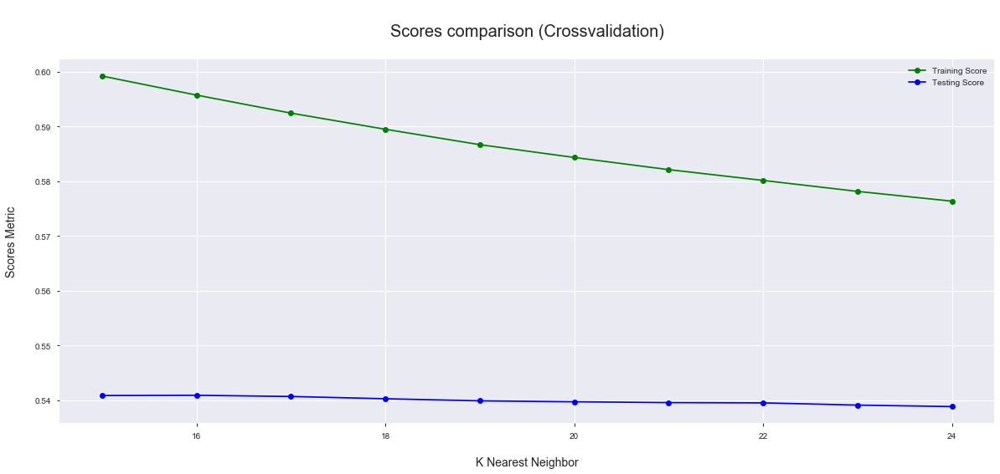

In [33]:
plt.figure(figsize=(20,8))
x_axis = list(range(15,25))
plt.plot(x_axis, results['mean_train_score'], c = 'g', label = 'Training Score',marker='o')
plt.plot(x_axis, results['mean_test_score'], c = 'b', label = 'Testing Score',marker='o')
#plt.annotate("Best Recall & PR-AUC score",fontsize=16,xy=(1, 0.78),xytext=(3, 0.82), arrowprops=dict(arrowstyle="-|>",connectionstyle="arc3",facecolor="red",edgecolor="red",linestyle='--',linewidth=2))
plt.legend(loc='best')
plt.title('\nScores comparison (Crossvalidation)\n',fontsize=20)
plt.xlabel('\nK Nearest Neighbor',fontsize=14)
plt.ylabel('Scores Metric\n',fontsize=14)
#plt.xticks(np.arange(0, 21, 1))
plt.show()

lets analyze the Crossvalidation testing score closely as we have to choose the best score

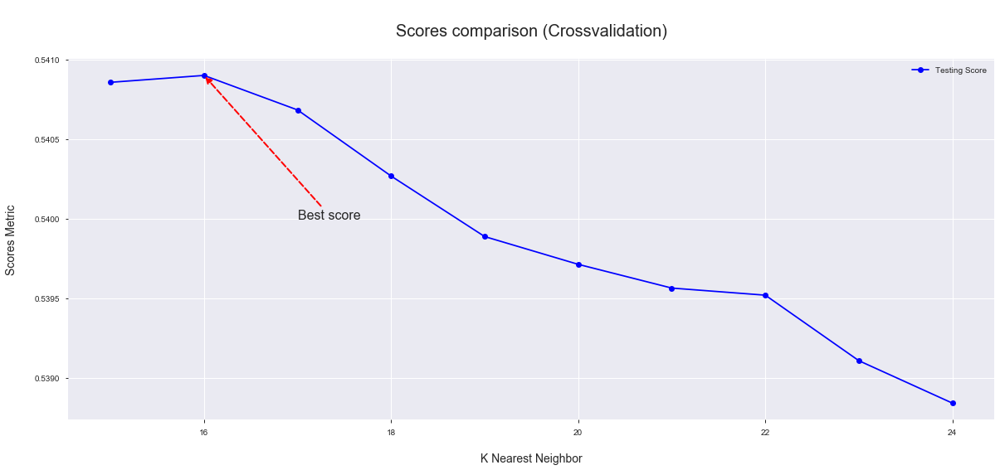

In [36]:
plt.figure(figsize=(20,8))
x_axis = list(range(15,25))
#plt.plot(x_axis, results[results['param_weights']=='distance']['mean_train_score'], c = 'g', label = 'Training Score',marker='o')
plt.plot(x_axis, results['mean_test_score'], c = 'b', label = 'Testing Score',marker='o')
plt.annotate("Best score",fontsize=16,xy=(16, 0.540901	),xytext=(17, 0.5400), arrowprops=dict(arrowstyle="-|>",connectionstyle="arc3",facecolor="red",edgecolor="red",linestyle='--',linewidth=2))
plt.legend(loc='best')
plt.title('\nScores comparison (Crossvalidation)\n',fontsize=20)
plt.xlabel('\nK Nearest Neighbor',fontsize=14)
plt.ylabel('Scores Metric\n',fontsize=14)
plt.show()

Let's calcualte the other metric scores for the best parameter of KNN model

In [37]:
pred=reg.predict(x_test_sc)

In [39]:
print(f'\nTest score without CV: {reg.score(x_test_sc,y_test)}\nMean Squared Error: {np.sqrt(mean_squared_error(y_test, pred))} \nR2 Score: {r2_score(y_test,pred)} \nMean Absolute Error: {mean_absolute_error(y_test,pred)}')


Test score without CV: 0.5626591662491057
Mean Squared Error: 0.4546417615184381 
R2 Score: 0.5626591662491057 
Mean Absolute Error: 0.32851908870924296


<div class="alert alert-block alert-success">
Let's Visualize the plot of the best fit line by the KNN model below for a sample of data with only one x variable and y variable for simplicity:
    <div>

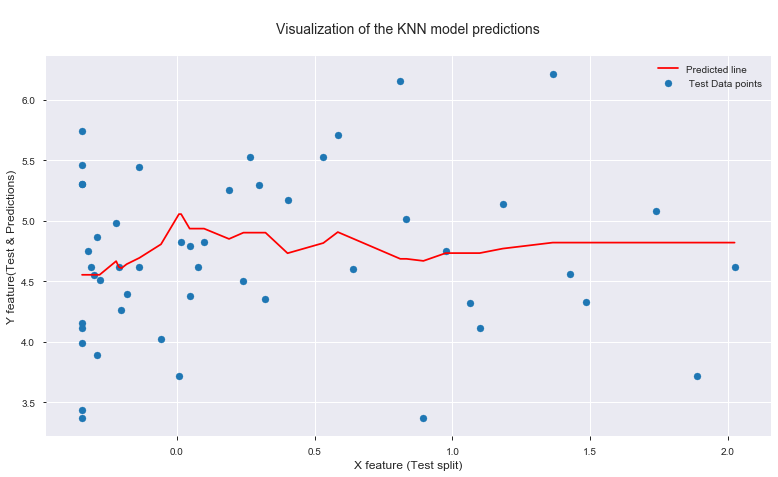

In [23]:
from sklearn.neighbors import KNeighborsRegressor
X_b = x_train_sc[:50,234].reshape(-1,1)
y_b = y_train[:50]
knn_reg = KNeighborsRegressor(16)
knn_reg.fit(X_b, y_b)
cm=pd.DataFrame({'x':x_test_sc[:50,234].tolist(),'y':y_test[:50].tolist()}).sort_values(by='x')
y_predict = knn_reg.predict(cm['x'].values.reshape(-1,1))
plt.figure(figsize=(13,7))
plt.plot(cm['x'].tolist(), y_predict, c = 'r',label='Predicted line')
plt.scatter(cm['x'].tolist(), cm['y'].tolist(),label=' Test Data points')
plt.title('\nVisualization of the KNN model predictions\n',fontsize=14)
plt.xlabel('X feature (Test split)',fontsize=12)
plt.ylabel('Y feature(Test & Predictions)',fontsize=12)
plt.legend()
plt.show()

<div class="alert alert-block alert-info">
<b><font size="5">  Linear Regression</font></b>

In [17]:
from sklearn.linear_model import LinearRegression
lnreg=LinearRegression()
lnreg.fit(x_train_sc,y_train)
print('\n\n"Linear Regression Model and it\'s Metrics" :\n')
print('\t• Training score of the Linear Regression Model is :',lnreg.score(x_train_sc,y_train))
print('\n\t• Testing score of the Linear Regression Model is :',lnreg.score(x_test_sc,y_test))
pred= lnreg.predict(x_test_sc)
print(f'\n\t• Mean Squared Error: {np.sqrt(mean_squared_error(y_test, pred))} \n\n\t• R2 Score: {r2_score(y_test,pred)} \n\n\t• Mean Absolute Error: {mean_absolute_error(y_test,pred)}')



"Linear Regression Model and it's Metrics" :

	• Training score of the Linear Regression Model is : 0.5540050007710471

	• Testing score of the Linear Regression Model is : -3.2041505409010644e+16

	• Mean Squared Error: 123059676.09234224 

	• R2 Score: -3.2041505409010644e+16 

	• Mean Absolute Error: 1801289.5356666942


<div class="alert alert-block alert-danger">
    
R<sup>2</sup>  is negative only when the chosen model does not follow the trend of the data, so fits worse than a horizontal line.(ie) the relationship between the independent variable and the dependent variable is not a simple linear relationship and it might be a complex linear relationship which cann't be captured by as a simple Linear regression model like as above.<br><br>
A negative R<sup>2</sup> is not a mathematical impossibility or the sign of a computer bug. It simply means that the chosen model (with its constraints) fits the data really poorly.<br><br>

When the test score is relatively poor than the training score , it indicates that the model is suffering from the problem of `over-generalization` or `over-fitting` and it can be eliminated by either `'Ridge'` or `'LASSO'` model which is also known as the Regularized Linear model<div>

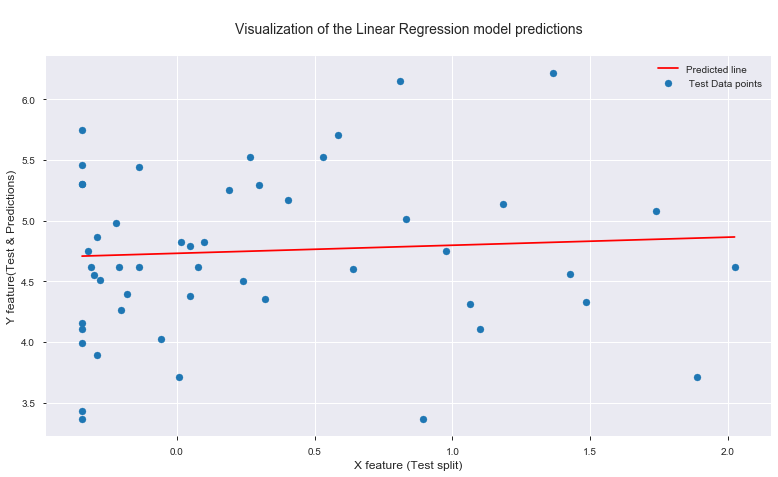

In [16]:
from sklearn.linear_model import LinearRegression

X_b = x_train_sc[:50,234].reshape(-1,1)
y_b = y_train[:50]
lnreg=LinearRegression()
lnreg.fit(X_b, y_b)
cm=pd.DataFrame({'x':x_test_sc[:50,234].tolist(),'y':y_test[:50].tolist()}).sort_values(by='x')
y_predict = lnreg.predict(cm['x'].values.reshape(-1,1))
plt.figure(figsize=(13,7))
plt.plot(cm['x'].tolist(), y_predict, c = 'r',label='Predicted line')
plt.scatter(cm['x'].tolist(), cm['y'].tolist(),label=' Test Data points')
plt.title('\nVisualization of the Linear Regression model predictions\n',fontsize=14)
plt.xlabel('X feature (Test split)',fontsize=12)
plt.ylabel('Y feature(Test & Predictions)',fontsize=12)
plt.legend()
plt.show()

<div class="alert alert-block alert-info">
<b><font size="5">  Ridge Regression</font></b>

In [16]:
from  sklearn.linear_model import Ridge

In [62]:
train_score_list = []
test_score_list = []
cross_score_list=[]
for alpha in [0.01,0.1,0.5,1,10,20]: 
    ridge = Ridge(alpha,random_state=41)
    scores = cross_val_score(ridge, x_train_sc, y_train, cv=5)
    print('\nFor alpha =',alpha)
    cross_score_list.append(scores.mean())
    ridge.fit(x_train_sc,y_train)
    y_pred=ridge.predict(x_test_sc)
    train_score_list.append(ridge.score(x_train_sc,y_train))
    test_score_list.append(ridge.score(x_test_sc, y_test))
    print('\n\t•Training score without Cross validation: ',train_score_list[-1])
    print('\n\t•Cross validation Training score mean:',scores.mean())
    print('\n\t•Testing score without Cross validation: ',test_score_list[-1])
    print(f'\n\t• Mean Squared Error: {(mean_squared_error(y_test, y_pred))} \n\n\t• R2 Score: {r2_score(y_test,y_pred)} \n\n\t• Mean Absolute Error: {mean_absolute_error(y_test,y_pred)}')
    print('----------------------------------------------------------------------------')


For alpha = 0.01

	•Training score without Cross validation:  0.5540048127120978

	•Cross validation Training score mean: 0.5462540239044318

	•Testing score without Cross validation:  0.5620253380044358

	• Mean Squared Error: 0.20699869572372037 

	• R2 Score: 0.5620253380044358 

	• Mean Absolute Error: 0.32931655125364995
----------------------------------------------------------------------------

For alpha = 0.1

	•Training score without Cross validation:  0.5540000138798813

	•Cross validation Training score mean: 0.5464340278909592

	•Testing score without Cross validation:  0.562089218196544

	• Mean Squared Error: 0.20696850421357973 

	• R2 Score: 0.562089218196544 

	• Mean Absolute Error: 0.32929127158406296
----------------------------------------------------------------------------

For alpha = 0.5

	•Training score without Cross validation:  0.5539272327759895

	•Cross validation Training score mean: 0.5469528391094621

	•Testing score without Cross validation:  0.5622

<div class="alert alert-block alert-success">     

From the above results we can see that the Ridge model yields the best results when `alpha =10` which leads to the best R<sup>2</sup> score of `0.5626008` and better than the simple Linear regression(which overfits the data)
    <div>

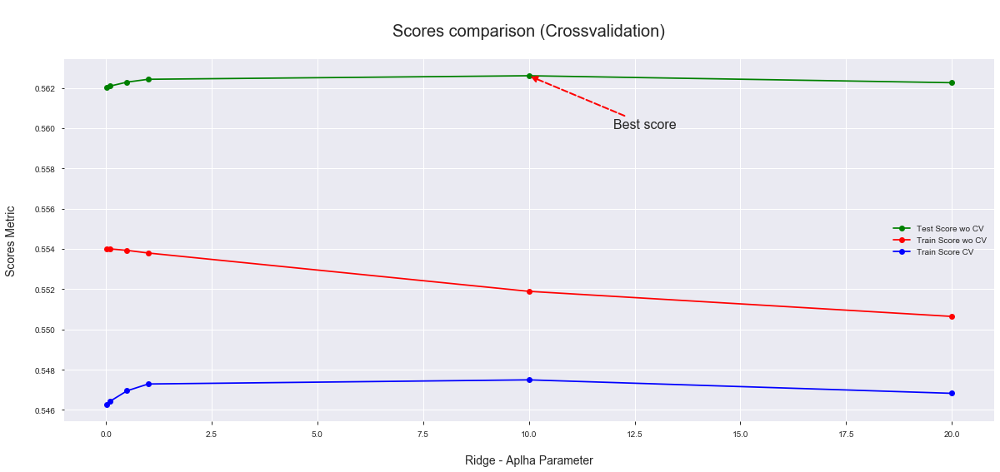

In [57]:
plt.figure(figsize=(20,8))
x_axis = [0.01,0.1,0.5,1,10,20]
plt.plot(x_axis, test_score_list , c = 'g', label = 'Test Score wo CV',marker='o')
plt.plot(x_axis, train_score_list, c = 'r', label = 'Train Score wo CV',marker='o')
plt.plot(x_axis, cross_score_list, c = 'b', label = 'Train Score CV',marker='o')
plt.annotate("Best score",fontsize=16,xy=(10, 0.5626008),xytext=(12, 0.560), arrowprops=dict(arrowstyle="-|>",connectionstyle="arc3",facecolor="red",edgecolor="red",linestyle='--',linewidth=2))
plt.legend(loc='best')
plt.title('\nScores comparison (Crossvalidation)\n',fontsize=20)
plt.xlabel('\nRidge - Aplha Parameter',fontsize=14)
plt.ylabel('Scores Metric\n',fontsize=14)
#plt.xticks(np.arange(0, 21, 1))
plt.show()

<div class="alert alert-block alert-success">
    Let's Visualize the best fitted line by the  Ridge Regression model

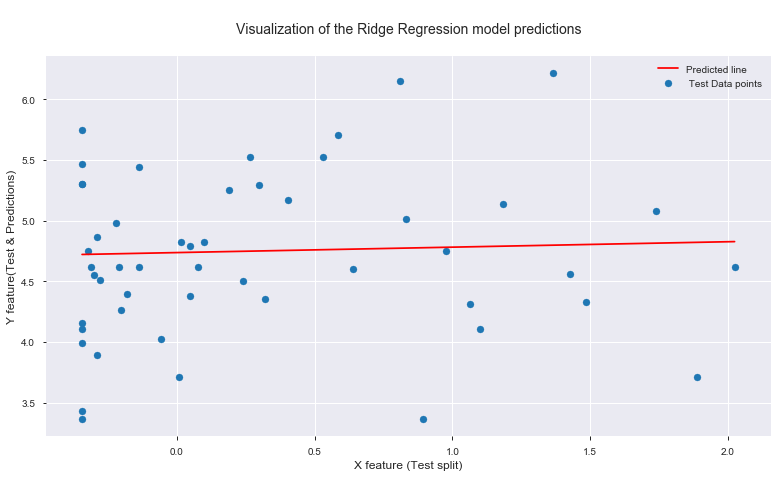

In [17]:
X_b = x_train_sc[:50,234].reshape(-1,1)
y_b = y_train[:50]
ridget = Ridge(alpha=10,random_state=41)
ridget.fit(X_b, y_b)
cm=pd.DataFrame({'x':x_test_sc[:50,234].tolist(),'y':y_test[:50].tolist()}).sort_values(by='x')
y_predict = ridget.predict(cm['x'].values.reshape(-1,1))
plt.figure(figsize=(13,7))
plt.plot(cm['x'].tolist(), y_predict, c = 'r',label='Predicted line')
plt.scatter(cm['x'].tolist(), cm['y'].tolist(),label=' Test Data points')
plt.title('\nVisualization of the Ridge Regression model predictions\n',fontsize=14)
plt.xlabel('X feature (Test split)',fontsize=12)
plt.ylabel('Y feature(Test & Predictions)',fontsize=12)
plt.legend()
plt.show()

<div class="alert alert-block alert-info">
<b><font size="5">  LASSO Regression (Least Absolute Shrinkage and Selection Operator) </font></b>

In [16]:
from sklearn.linear_model import Lasso

In [20]:
train_score_list = []
test_score_list = []
cross_score_list=[]
for alpha in [0.0000001,0.00001,0.0001,0.001,0.01,0.1,0.5,0.8,1]: 
    lasso = Lasso(alpha,random_state=41,max_iter=3000)
    scores = cross_val_score(lasso, x_train_sc, y_train, cv=5)
    print('\nFor alpha =',alpha)
    cross_score_list.append(scores.mean())
    lasso.fit(x_train_sc,y_train)
    y_pred=lasso.predict(x_test_sc)
    train_score_list.append(lasso.score(x_train_sc,y_train))
    test_score_list.append(lasso.score(x_test_sc, y_test))
    print('\n\t•Training score without Cross validation: ',train_score_list[-1])
    print('\n\t•Cross validation Training score mean:',scores.mean())
    print('\n\t•Testing score without Cross validation: ',test_score_list[-1])
    print(f'\n\t• Mean Squared Error: {(mean_squared_error(y_test, y_pred))} \n\n\t• R2 Score: {r2_score(y_test,y_pred)} \n\n\t• Mean Absolute Error: {mean_absolute_error(y_test,y_pred)}')
    print('----------------------------------------------------------------------------')


For alpha = 1e-07

	•Training score without Cross validation:  0.5540048351555311

	•Cross validation Training score mean: 0.546255666913385

	•Testing score without Cross validation:  0.5620125301114587

	• Mean Squared Error: 0.20700474908107477 

	• R2 Score: 0.5620125301114587 

	• Mean Absolute Error: 0.3293211384669916
----------------------------------------------------------------------------

For alpha = 1e-05

	•Training score without Cross validation:  0.5537825714266555

	•Cross validation Training score mean: 0.5470157955525778

	•Testing score without Cross validation:  0.5622228218318759

	• Mean Squared Error: 0.2069053595144511 

	• R2 Score: 0.5622228218318759 

	• Mean Absolute Error: 0.3292083291731226
----------------------------------------------------------------------------

For alpha = 0.0001

	•Training score without Cross validation:  0.5498944480020576

	•Cross validation Training score mean: 0.5468485355901433

	•Testing score without Cross validation:  0.

<div class="alert alert-block alert-success">

From the above results we can see that the LASSO model yields the best results when `alpha =1e-05` which leads to the best R<sup>2</sup> score of `0.5622228` and better than the simple Linear regression(which overfits the data)
    <div>

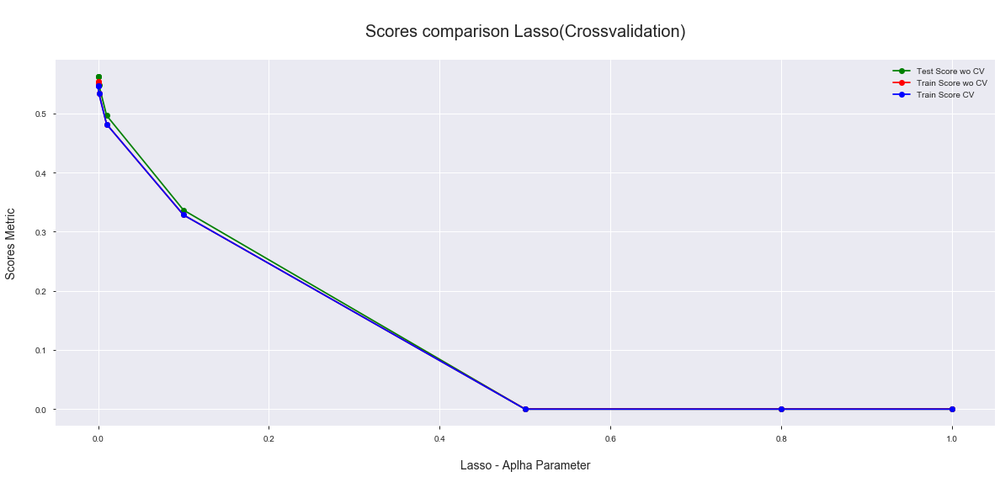

In [23]:
plt.figure(figsize=(20,8))
x_axis = [0.0000001,0.00001,0.0001,0.001,0.01,0.1,0.5,0.8,1]
plt.plot(x_axis, test_score_list, c = 'g', label = 'Test Score wo CV',marker='o')
plt.plot(x_axis, train_score_list, c = 'r', label = 'Train Score wo CV',marker='o')
plt.plot(x_axis, cross_score_list , c = 'b', label = 'Train Score CV',marker='o')
#plt.annotate("Best score",fontsize=16,xy=(10, 0.5626008),xytext=(12, 0.560), arrowprops=dict(arrowstyle="-|>",connectionstyle="arc3",facecolor="red",edgecolor="red",linestyle='--',linewidth=2))
plt.legend(loc='best')
plt.title('\nScores comparison Lasso(Crossvalidation)\n',fontsize=20)
plt.xlabel('\nLasso - Aplha Parameter',fontsize=14)
plt.ylabel('Scores Metric\n',fontsize=14)
#plt.xticks(np.arange(0, 21, 1))
plt.show()

Let's Visualize closely to the required parameters only

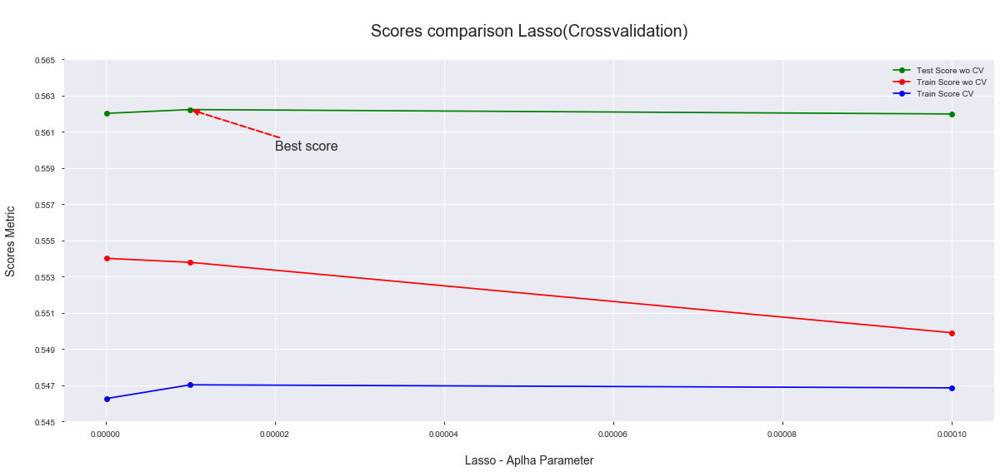

In [29]:
plt.figure(figsize=(20,8))
x_axis = [0.0000001,0.00001,0.0001]
plt.plot(x_axis, test_score_list[:3], c = 'g', label = 'Test Score wo CV',marker='o')
plt.plot(x_axis, train_score_list[:3], c = 'r', label = 'Train Score wo CV',marker='o')
plt.plot(x_axis, cross_score_list[:3] , c = 'b', label = 'Train Score CV',marker='o')
plt.annotate("Best score",fontsize=16,xy=(0.00001, 0.562222),xytext=(0.00002, 0.560), arrowprops=dict(arrowstyle="-|>",connectionstyle="arc3",facecolor="red",edgecolor="red",linestyle='--',linewidth=2))
plt.legend(loc='best')
plt.title('\nScores comparison Lasso(Crossvalidation)\n',fontsize=20)
plt.xlabel('\nLasso - Aplha Parameter',fontsize=14)
plt.ylabel('Scores Metric\n',fontsize=14)
plt.yticks(np.arange(0.545, 0.566, 0.002))
plt.show()

<div class="alert alert-block alert-success">Let's visualize the best fitted line by the LASSO Model 

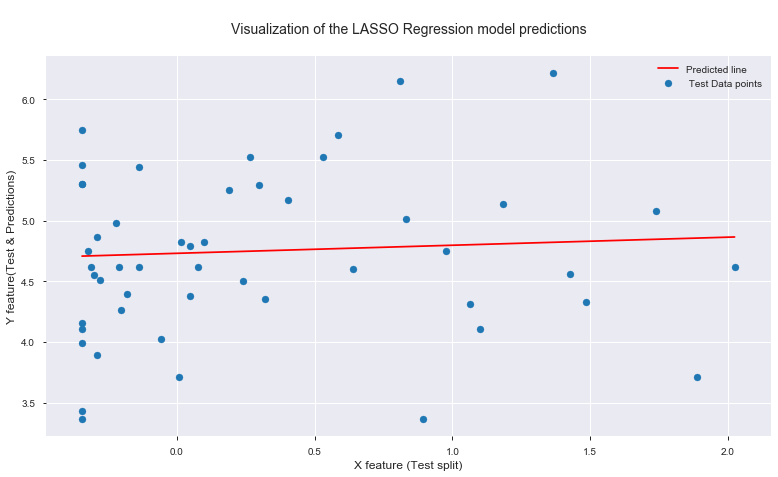

In [17]:
X_b = x_train_sc[:50,234].reshape(-1,1)
y_b = y_train[:50]
lassot = Lasso(alpha=0.00001,random_state=41,max_iter=3000)
lassot.fit(X_b, y_b)
cm=pd.DataFrame({'x':x_test_sc[:50,234].tolist(),'y':y_test[:50].tolist()}).sort_values(by='x')
y_predict = lassot.predict(cm['x'].values.reshape(-1,1))
plt.figure(figsize=(13,7))
plt.plot(cm['x'].tolist(), y_predict, c = 'r',label='Predicted line')
plt.scatter(cm['x'].tolist(), cm['y'].tolist(),label=' Test Data points')
plt.title('\nVisualization of the LASSO Regression model predictions\n',fontsize=14)
plt.xlabel('X feature (Test split)',fontsize=12)
plt.ylabel('Y feature(Test & Predictions)',fontsize=12)
plt.legend()
plt.show()

<div class="alert alert-block alert-info">
<b><font size="5">  SVM- Kernal RBF (Radial Bias Function) Regressor </font></b>

In [16]:
from sklearn.svm import SVR

In [ ]:
train_score_list = []
test_score_list = []
cross_score_list=[]
for C in [0.001]: 
    for g in [0.001, 0.01, 0.1, 1, 10]:
            svreg = SVR(kernel='rbf',gamma=g,C=C)
            print('\nFor C= ',C,' and gamma = ',g)
            svreg.fit(x_train_sc,y_train)
            y_pred=svreg.predict(x_test_sc)
            train_score_list.append(svreg.score(x_train_sc,y_train))
            test_score_list.append(svreg.score(x_test_sc, y_test))
            print('\n\t•Training score without Cross validation: ',train_score_list[-1])
            print('\n\t•Testing score without Cross validation: ',test_score_list[-1])
            print(f'\n\t•Root Mean Squared Error: {np.sqrt(mean_squared_error(y_test, y_pred))} \n\n\t• R2 Score: {r2_score(y_test,y_pred)} \n\n\t• Mean Absolute Error: {mean_absolute_error(y_test,y_pred)}')
            print('----------------------------------------------------------------------------')


For C=  0.001  and gamma =  0.001

	•Training score without Cross validation:  0.05394653829354257

	•Testing score without Cross validation:  0.056456900801035936

	•Root Mean Squared Error: 0.6677904174293893 

	• R2 Score: 0.056456900801035936 

	• Mean Absolute Error: 0.5242783531816355
----------------------------------------------------------------------------

For C=  0.001  and gamma =  0.01

	•Training score without Cross validation:  0.27216524865607417

	•Testing score without Cross validation:  0.28011660390303195

	•Root Mean Squared Error: 0.5832978690656316 

	• R2 Score: 0.28011660390303195 

	• Mean Absolute Error: 0.4376171000192927
----------------------------------------------------------------------------

For C=  0.001  and gamma =  0.1

	•Training score without Cross validation:  0.388758922979212

	•Testing score without Cross validation:  0.40472283080887395

	•Root Mean Squared Error: 0.5304188194319758 

	• R2 Score: 0.40472283080887395 

	• Mean Absolute Er

In [ ]:
train_score_list = []
test_score_list = []
cross_score_list=[]
for C in [0.01, 0.1, 1, 10, 100]: 
    for g in [0.001, 0.01, 0.1, 1, 10]:
            svreg = SVR(kernel='rbf',gamma=g,C=C)
            print('\nFor C= ',C,' and gamma = ',g)
            svreg.fit(x_train_sc,y_train)
            y_pred=svreg.predict(x_test_sc)
            train_score_list.append(svreg.score(x_train_sc,y_train))
            test_score_list.append(svreg.score(x_test_sc, y_test))
            print('\n\t•Training score without Cross validation: ',train_score_list[-1])
            print('\n\t•Testing score without Cross validation: ',test_score_list[-1])
            print(f'\n\t•Root Mean Squared Error: {np.sqrt(mean_squared_error(y_test, y_pred))} \n\n\t• R2 Score: {r2_score(y_test,y_pred)} \n\n\t• Mean Absolute Error: {mean_absolute_error(y_test,y_pred)}')
            print('----------------------------------------------------------------------------')


For C=  0.01  and gamma =  0.001

	•Training score without Cross validation:  0.292763177724774

	•Testing score without Cross validation:  0.3022419259067396

	•Root Mean Squared Error: 0.5742642050598881 

	• R2 Score: 0.3022419259067396 

	• Mean Absolute Error: 0.4289647743373976
----------------------------------------------------------------------------

For C=  0.01  and gamma =  0.01

	•Training score without Cross validation:  0.4663739033307923

	•Testing score without Cross validation:  0.48127135793108633

	•Root Mean Squared Error: 0.49514161144908264 

	• R2 Score: 0.48127135793108633 

	• Mean Absolute Error: 0.3526101541657647
----------------------------------------------------------------------------

For C=  0.01  and gamma =  0.1

	•Training score without Cross validation:  0.5205559298428485

	•Testing score without Cross validation:  0.5347358217866858

	•Root Mean Squared Error: 0.468931189747829 

	• R2 Score: 0.5347358217866858 

	• Mean Absolute Error: 0.3303

<div class="alert alert-block alert-success">

From the above results we can see that the SVM RBF model yields the best results when `C =1` and `gamma = 0.1`which leads to the best R<sup>2</sup> score of `0.5944894` 
    <div>

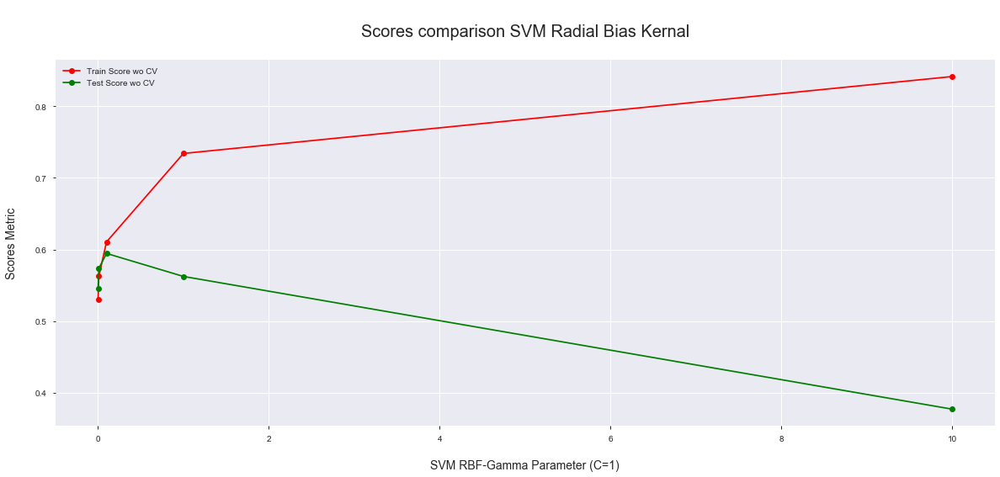

In [17]:
plt.figure(figsize=(20,8))
x_axis = [0.001, 0.01, 0.1, 1, 10]
plt.plot(x_axis, [0.5304475946029784,0.5626110732925353,0.610588844399322,0.7339359624711055,0.841277251910687,], c = 'r', label = 'Train Score wo CV',marker='o')
plt.plot(x_axis, [0.5454909000225565,0.5736086640755327,0.59448946596,0.5624108361388298,0.3772408690204,], c = 'g', label = 'Test Score wo CV',marker='o')
#plt.annotate("Best score",fontsize=16,xy=(10, 0.5626008),xytext=(12, 0.560), arrowprops=dict(arrowstyle="-|>",connectionstyle="arc3",facecolor="red",edgecolor="red",linestyle='--',linewidth=2))
plt.legend(loc='best')
plt.title('\nScores comparison SVM Radial Bias Kernal\n',fontsize=20)
plt.xlabel('\nSVM RBF-Gamma Parameter (C=1)',fontsize=14)
plt.ylabel('Scores Metric\n',fontsize=14)
#plt.xticks(np.arange(0, 21, 1))
plt.show()

<div class="alert alert-block alert-success">

Let's Visualize closely
<div>

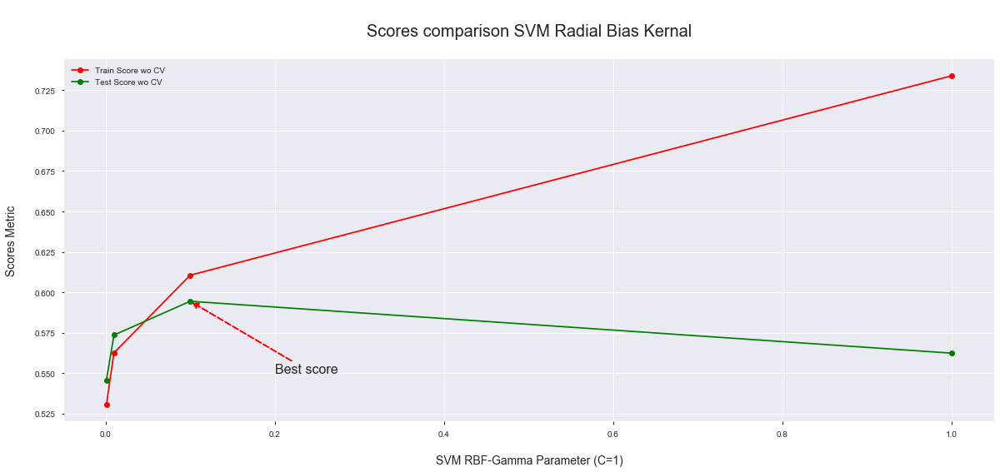

In [19]:
plt.figure(figsize=(20,8))
x_axis = [0.001, 0.01, 0.1, 1]
plt.plot(x_axis, [0.5304475946029784,0.5626110732925353,0.610588844399322,0.7339359624711055], c = 'r', label = 'Train Score wo CV',marker='o')
plt.plot(x_axis, [0.5454909000225565,0.5736086640755327,0.59448946596,0.5624108361388298], c = 'g', label = 'Test Score wo CV',marker='o')
plt.annotate("Best score",fontsize=16,xy=(0.1, 0.59448946596),xytext=(0.2, 0.550), arrowprops=dict(arrowstyle="-|>",connectionstyle="arc3",facecolor="red",edgecolor="red",linestyle='--',linewidth=2))
plt.legend(loc='best')
plt.title('\nScores comparison SVM Radial Bias Kernal\n',fontsize=20)
plt.xlabel('\nSVM RBF-Gamma Parameter (C=1)',fontsize=14)
plt.ylabel('Scores Metric\n',fontsize=14)
#plt.xticks(np.arange(0, 21, 1))
plt.show()

<div class="alert alert-block alert-success">Let's visualize the best fitted line by the SVM RBF Model 

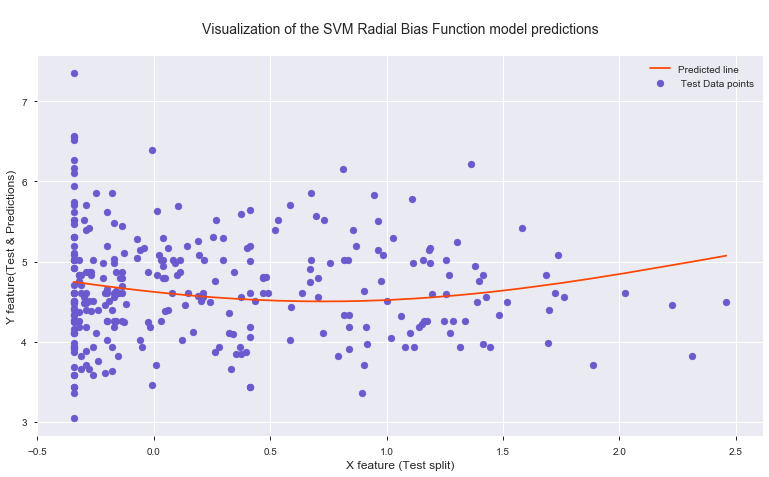

In [19]:
X_b = x_train_sc[:300,234].reshape(-1,1)
y_b = y_train[:300]
svregt = SVR(kernel='rbf',gamma=0.1,C=1)
svregt.fit(X_b, y_b)
cm=pd.DataFrame({'x':x_test_sc[:300,234].tolist(),'y':y_test[:300].tolist()}).sort_values(by='x')
y_predict = svregt.predict(cm['x'].values.reshape(-1,1))
plt.figure(figsize=(13,7))
plt.plot(cm['x'].tolist(), y_predict, c = 'orangered',label='Predicted line')
plt.scatter(cm['x'].tolist(), cm['y'].tolist(),label=' Test Data points',c='slateblue')
plt.title('\nVisualization of the SVM Radial Bias Function model predictions\n',fontsize=14)
plt.xlabel('X feature (Test split)',fontsize=12)
plt.ylabel('Y feature(Test & Predictions)',fontsize=12)
plt.legend()
plt.show()

<div class="alert alert-block alert-info">
<b><font size="5">  Linear Support Vector Regressor </font></b>

In [16]:
from sklearn.svm import LinearSVR

In [18]:
from sklearn.svm import LinearSVR
train_score_list = []
test_score_list = []
cross_score_list=[]
for C in [0.001, 0.01, 0.1, 1, 10, 100]:
    svreg = LinearSVR(random_state=41,C=C)
    scores = cross_val_score(svreg, x_train_sc, y_train, cv=5)
    print('\nFor C= ',C)
    cross_score_list.append(scores.mean())
    svreg.fit(x_train_sc,y_train)
    y_pred=svreg.predict(x_test_sc)
    train_score_list.append(svreg.score(x_train_sc,y_train))
    test_score_list.append(svreg.score(x_test_sc, y_test))
    print('\n\t•Training score without Cross validation: ',train_score_list[-1])
    print('\n\t•Cross validation Training score mean:',scores.mean())
    print('\n\t•Testing score without Cross validation: ',test_score_list[-1])
    print(f'\n\t• Mean Squared Error: {(mean_squared_error(y_test, y_pred))} \n\n\t• R2 Score: {r2_score(y_test,y_pred)} \n\n\t• Mean Absolute Error: {mean_absolute_error(y_test,y_pred)}')
    print('----------------------------------------------------------------------------')


For C=  0.001

	•Training score without Cross validation:  0.46478045342657326

	•Cross validation Training score mean: 0.43885519364472775

	•Testing score without Cross validation:  0.4749433937707698

	• Mean Squared Error: 0.24815598275791223 

	• R2 Score: 0.4749433937707698 

	• Mean Absolute Error: 0.34985003315434676
----------------------------------------------------------------------------

For C=  0.01

	•Training score without Cross validation:  0.534838764363503

	•Cross validation Training score mean: 0.5316509037366519

	•Testing score without Cross validation:  0.5482238990569123

	• Mean Squared Error: 0.2135216298318968 

	• R2 Score: 0.5482238990569123 

	• Mean Absolute Error: 0.32525044280430415
----------------------------------------------------------------------------

For C=  0.1

	•Training score without Cross validation:  0.541728029957643

	•Cross validation Training score mean: 0.5381414779120746

	•Testing score without Cross validation:  0.5534169049287

<div class="alert alert-block alert-success">

From the above results we can see that the Linear SVR model yields the best results when `C = 0.1` which leads to the best R<sup>2</sup> score of `0.5534169`
    <div>

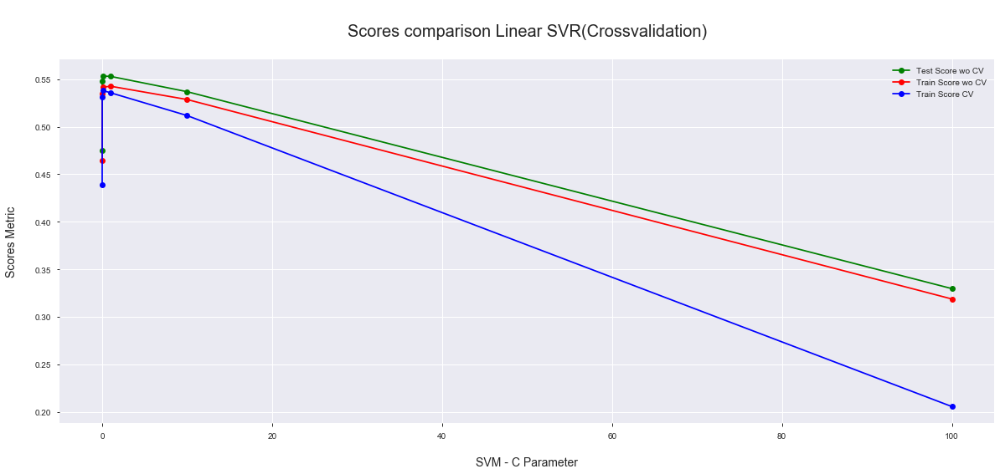

In [19]:
plt.figure(figsize=(20,8))
x_axis = [0.001, 0.01, 0.1, 1, 10, 100]
plt.plot(x_axis, test_score_list, c = 'g', label = 'Test Score wo CV',marker='o')
plt.plot(x_axis, train_score_list, c = 'r', label = 'Train Score wo CV',marker='o')
plt.plot(x_axis, cross_score_list , c = 'b', label = 'Train Score CV',marker='o')
#plt.annotate("Best score",fontsize=16,xy=(10, 0.5626008),xytext=(12, 0.560), arrowprops=dict(arrowstyle="-|>",connectionstyle="arc3",facecolor="red",edgecolor="red",linestyle='--',linewidth=2))
plt.legend(loc='best')
plt.title('\nScores comparison Linear SVR(Crossvalidation)\n',fontsize=20)
plt.xlabel('\nSVM - C Parameter',fontsize=14)
plt.ylabel('Scores Metric\n',fontsize=14)
#plt.xticks(np.arange(0, 21, 1))
plt.show()

Let's Visualize closely to get the best parameter

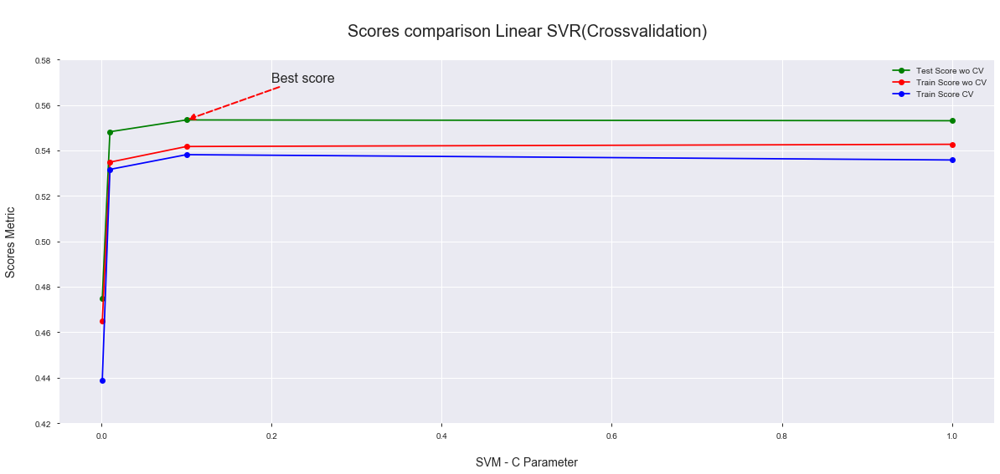

In [27]:
plt.figure(figsize=(20,8))
x_axis = [0.001, 0.01, 0.1,1]
plt.plot(x_axis, test_score_list[:4], c = 'g', label = 'Test Score wo CV',marker='o')
plt.plot(x_axis, train_score_list[:4], c = 'r', label = 'Train Score wo CV',marker='o')
plt.plot(x_axis, cross_score_list[:4] , c = 'b', label = 'Train Score CV',marker='o')
plt.annotate("Best score",fontsize=16,xy=(0.1, 0.5534169),xytext=(0.2, 0.570), arrowprops=dict(arrowstyle="-|>",connectionstyle="arc3",facecolor="red",edgecolor="red",linestyle='--',linewidth=2))
plt.legend(loc='best')
plt.title('\nScores comparison Linear SVR(Crossvalidation)\n',fontsize=20)
plt.xlabel('\nSVM - C Parameter',fontsize=14)
plt.ylabel('Scores Metric\n',fontsize=14)
plt.yticks(np.arange(0.42, 0.60, 0.02))
plt.show()

<div class="alert alert-block alert-success">Let's visualize the best fitted line by the Linear SVR Model 

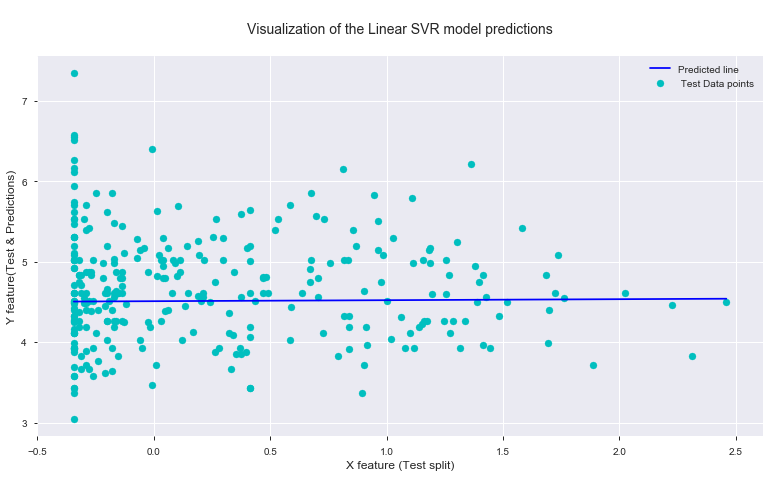

In [20]:
X_b = x_train_sc[:300,234].reshape(-1,1)
y_b = y_train[:300]
svregt = LinearSVR(random_state=41,C=0.1)
svregt.fit(X_b, y_b)
cm=pd.DataFrame({'x':x_test_sc[:300,234].tolist(),'y':y_test[:300].tolist()}).sort_values(by='x')
y_predict = svregt.predict(cm['x'].values.reshape(-1,1))
plt.figure(figsize=(13,7))
plt.plot(cm['x'].tolist(), y_predict, c = 'b',label='Predicted line')
plt.scatter(cm['x'].tolist(), cm['y'].tolist(),label=' Test Data points',c='c')
plt.title('\nVisualization of the Linear SVR model predictions\n',fontsize=14)
plt.xlabel('X feature (Test split)',fontsize=12)
plt.ylabel('Y feature(Test & Predictions)',fontsize=12)
plt.legend()
plt.show()

<div class="alert alert-block alert-info">
<b><font size="5">  SGD Regressor (Stochastic Gradient Descendant Regressor) </font></b>

In [17]:
from sklearn.linear_model import SGDRegressor

In [48]:
sgdParameter={
    'alpha':[0.00001,0.0001,0.001,0.01,0.1,0.5,0.8,1],
    'learning_rate':['constant','optimal','invscaling','adaptive']
}
grd=SGDRegressor(penalty='l1',loss='squared_loss',random_state=42)

In [49]:
sgd = GridSearchCV(grd, sgdParameter, cv = 5, return_train_score=True,n_jobs=-1)

In [50]:
sgd.fit(x_train_sc, y_train)

GridSearchCV(cv=5, error_score='raise-deprecating',
             estimator=SGDRegressor(alpha=0.0001, average=False,
                                    early_stopping=False, epsilon=0.1,
                                    eta0=0.01, fit_intercept=True,
                                    l1_ratio=0.15, learning_rate='invscaling',
                                    loss='squared_loss', max_iter=1000,
                                    n_iter_no_change=5, penalty='l1',
                                    power_t=0.25, random_state=42, shuffle=True,
                                    tol=0.001, validation_fraction=0.1,
                                    verbose=0, warm_start=False),
             iid='warn', n_jobs=-1,
             param_grid={'alpha': [1e-05, 0.0001, 0.001, 0.01, 0.1, 0.5, 0.8,
                                   1],
                         'learning_rate': ['constant', 'optimal', 'invscaling',
                                           'adaptive']},
             pr

In [51]:
sgd.best_params_

{'alpha': 1e-05, 'learning_rate': 'adaptive'}

In [52]:
sgd.best_score_

0.5475126118388294

In [53]:
results=pd.DataFrame(sgd.cv_results_)
results

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_alpha,param_learning_rate,params,split0_test_score,split1_test_score,split2_test_score,...,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,2.506426,0.290417,0.011204,0.003712,1e-05,constant,"{'alpha': 1e-05, 'learning_rate': 'constant'}",5.270032e-01,5.146853e-01,5.581400e-01,...,5.219414e-01,1.988253e-02,9,5.235581e-01,5.365137e-01,5.333987e-01,5.228586e-01,5.257799e-01,5.284218e-01,5.510557e-03
1,46.049111,58.715462,0.010205,0.002925,1e-05,optimal,"{'alpha': 1e-05, 'learning_rate': 'optimal'}",-4.539280e+20,-7.443255e+18,-4.407195e+18,...,-1.417998e+20,1.815191e+20,28,-8.846052e+20,-3.963475e+19,-7.220060e+19,-2.090919e+14,-2.432162e+20,-2.479314e+20,3.289725e+20
2,1.825653,0.095776,0.009800,0.001167,1e-05,invscaling,"{'alpha': 1e-05, 'learning_rate': 'invscaling'}",5.488687e-01,5.271076e-01,5.645465e-01,...,5.405274e-01,1.437177e-02,3,5.405348e-01,5.456778e-01,5.365261e-01,5.440529e-01,5.453229e-01,5.424229e-01,3.464056e-03
3,9.393337,1.163734,0.018808,0.010614,1e-05,adaptive,"{'alpha': 1e-05, 'learning_rate': 'adaptive'}",5.565555e-01,5.321565e-01,5.737686e-01,...,5.475126e-01,1.559706e-02,1,5.502947e-01,5.564074e-01,5.458838e-01,5.546158e-01,5.559466e-01,5.526297e-01,4.004399e-03
4,2.684670,0.149651,0.012605,0.003009,0.0001,constant,"{'alpha': 0.0001, 'learning_rate': 'constant'}",5.446823e-01,4.812267e-01,5.549320e-01,...,5.220102e-01,2.600310e-02,8,5.401938e-01,5.049412e-01,5.266425e-01,5.311743e-01,5.297346e-01,5.265373e-01,1.170150e-02
5,168.351918,3.242793,0.010604,0.002939,0.0001,optimal,"{'alpha': 0.0001, 'learning_rate': 'optimal'}",-7.432993e+21,-9.313585e+20,-2.046517e+19,...,-1.997876e+21,2.740393e+21,30,-3.796205e+21,-1.221971e+21,-6.082997e+20,-1.800588e+21,-5.288764e+20,-1.591188e+21,1.194726e+21
6,1.653805,0.133095,0.012005,0.004150,0.0001,invscaling,"{'alpha': 0.0001, 'learning_rate': 'invscaling'}",5.477645e-01,5.262664e-01,5.634352e-01,...,5.395739e-01,1.426679e-02,4,5.393974e-01,5.446386e-01,5.354826e-01,5.429136e-01,5.442681e-01,5.413401e-01,3.464511e-03
7,5.931263,0.881903,0.013804,0.003375,0.0001,adaptive,"{'alpha': 0.0001, 'learning_rate': 'adaptive'}",5.550741e-01,5.312007e-01,5.726931e-01,...,5.465456e-01,1.544589e-02,2,5.475357e-01,5.537557e-01,5.431415e-01,5.518283e-01,5.529075e-01,5.498337e-01,3.971783e-03
8,2.182144,0.208970,0.011404,0.002500,0.001,constant,"{'alpha': 0.001, 'learning_rate': 'constant'}",5.261678e-01,5.132793e-01,5.490376e-01,...,5.257732e-01,1.322342e-02,7,5.223159e-01,5.306966e-01,5.217090e-01,5.301466e-01,5.322801e-01,5.274296e-01,4.482368e-03
9,153.659571,6.554950,0.010601,0.001737,0.001,optimal,"{'alpha': 0.001, 'learning_rate': 'optimal'}",-6.612504e+21,-3.457239e+21,-5.578577e+21,...,-5.349050e+21,2.315786e+21,32,-3.335027e+21,-4.972864e+21,-4.648863e+21,-4.277222e+21,-6.415760e+21,-4.729947e+21,1.005814e+21


In [63]:
results.to_csv('sgdgridsearchop.csv') #exporting the gridsearch cv results for presentation

<div class="alert alert-block alert-success">

From the above Grid Search CV results we can see that the SGD Regressor  model yields the best results when `'alpha'` is `1e-05`, `'learning_rate'` is `'adaptive'` which leads to the best R<sup>2</sup> score of `0.5475126`
    <div>

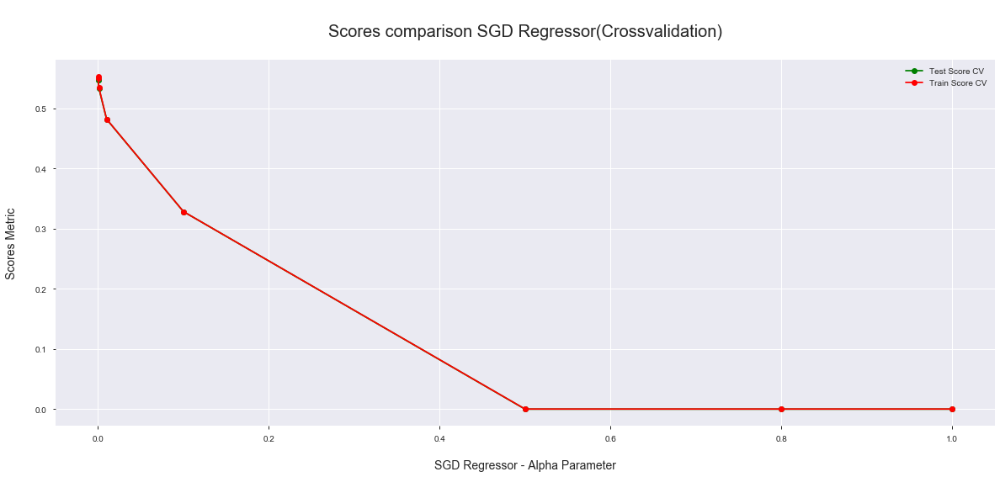

In [54]:
plt.figure(figsize=(20,8))
x_axis = [0.00001,0.0001,0.001,0.01,0.1,0.5,0.8,1]
plt.plot(x_axis, results[results['param_learning_rate']=='adaptive']['mean_test_score'], c = 'g', label = 'Test Score CV',marker='o')
plt.plot(x_axis, results[results['param_learning_rate']=='adaptive']['mean_train_score'], c = 'r', label = 'Train Score CV',marker='o')
#plt.annotate("Best score",fontsize=16,xy=(10, 0.5626008),xytext=(12, 0.560), arrowprops=dict(arrowstyle="-|>",connectionstyle="arc3",facecolor="red",edgecolor="red",linestyle='--',linewidth=2))
plt.legend(loc='best')
plt.title('\nScores comparison SGD Regressor(Crossvalidation)\n',fontsize=20)
plt.xlabel('\nSGD Regressor - Alpha Parameter',fontsize=14)
plt.ylabel('Scores Metric\n',fontsize=14)
#plt.xticks(np.arange(0, 21, 1))
plt.show()

Let's Visualize Closely

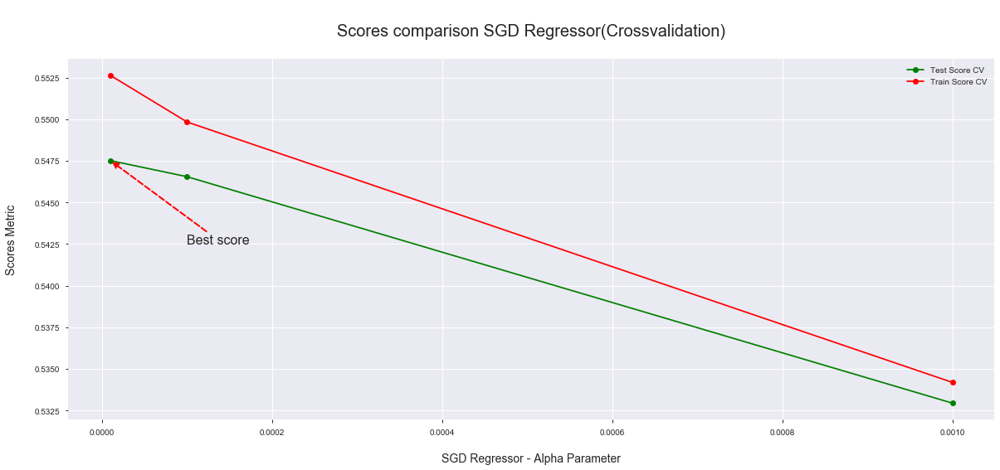

In [61]:
plt.figure(figsize=(20,8))
x_axis = [0.00001,0.0001,0.001]
plt.plot(x_axis, results[results['param_learning_rate']=='adaptive']['mean_test_score'][:3], c = 'g', label = 'Test Score CV',marker='o')
plt.plot(x_axis, results[results['param_learning_rate']=='adaptive']['mean_train_score'][:3], c = 'r', label = 'Train Score CV',marker='o')
plt.annotate("Best score",fontsize=16,xy=(0.00001, 5.475126e-01),xytext=(0.0001, 0.5425), arrowprops=dict(arrowstyle="-|>",connectionstyle="arc3",facecolor="red",edgecolor="red",linestyle='--',linewidth=2))
plt.legend(loc='best')
plt.title('\nScores comparison SGD Regressor(Crossvalidation)\n',fontsize=20)
plt.xlabel('\nSGD Regressor - Alpha Parameter',fontsize=14)
plt.ylabel('Scores Metric\n',fontsize=14)
#plt.xticks(np.arange(0, 21, 1))
plt.show()

<div class="alert alert-block alert-success">Let's visualize the best fitted line by the SGD Regressor Model 

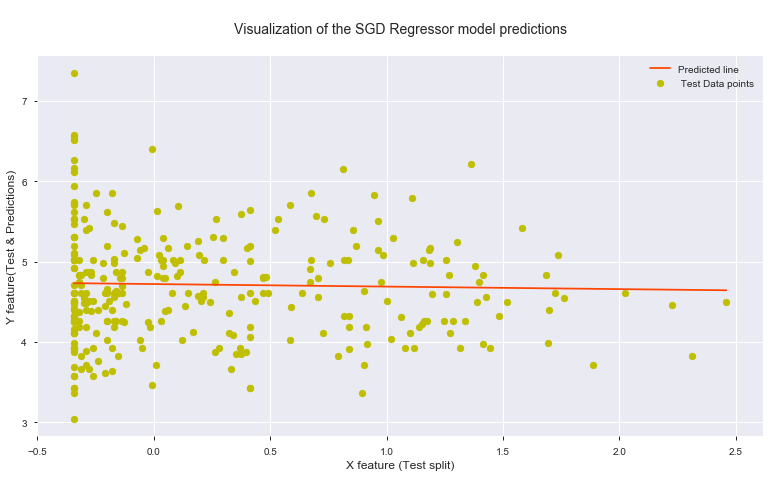

In [22]:
X_b = x_train_sc[:300,234].reshape(-1,1)
y_b = y_train[:300]
grdt=SGDRegressor(penalty='l1',loss='squared_loss',random_state=42,alpha=0.00001,learning_rate='adaptive')
grdt.fit(X_b, y_b)
cm=pd.DataFrame({'x':x_test_sc[:300,234].tolist(),'y':y_test[:300].tolist()}).sort_values(by='x')
y_predict = grdt.predict(cm['x'].values.reshape(-1,1))
plt.figure(figsize=(13,7))
plt.plot(cm['x'].tolist(), y_predict, c = 'orangered',label='Predicted line')
plt.scatter(cm['x'].tolist(), cm['y'].tolist(),label=' Test Data points',c='y')
plt.title('\nVisualization of the SGD Regressor model predictions\n',fontsize=14)
plt.xlabel('X feature (Test split)',fontsize=12)
plt.ylabel('Y feature(Test & Predictions)',fontsize=12)
plt.legend()
plt.show()

<div class="alert alert-block alert-info">
<b><font size="5">  Decision Tree Regressor  </font></b>

In [17]:
from sklearn.tree import DecisionTreeRegressor

for the Decision tree we dont need the scaled data as like for the other models we can just pass in the non-scaled data

In [17]:
from sklearn.tree import DecisionTreeRegressor
train_score_list = []
test_score_list = []
cross_score_list=[]
for d in [3,5,8,10,12,15,18,20,22,24]:
    dtree = DecisionTreeRegressor(max_depth=d,random_state=41)#Mean Absolute Error (MAE) criterion.
    scores = cross_val_score(dtree, x_train, y_train, cv=5)
    print('\nFor max_depth = ',d)
    cross_score_list.append(scores.mean())
    dtree.fit(x_train,y_train)
    y_pred=dtree.predict(x_test)
    train_score_list.append(dtree.score(x_train,y_train))
    test_score_list.append(dtree.score(x_test, y_test))
    print('\n\t•Training score without Cross validation: ',train_score_list[-1])
    print('\n\t•Cross validation Training score mean:',scores.mean())
    print('\n\t•Testing score without Cross validation: ',test_score_list[-1])
    print(f'\n\t• Root Mean Squared Error: {np.sqrt(mean_squared_error(y_test, y_pred))} \n\n\t• R2 Score: {r2_score(y_test,y_pred)} \n\n\t• Mean Absolute Error: {mean_absolute_error(y_test,y_pred)}')
    print('----------------------------------------------------------------------------')


For max_depth =  3

	•Training score without Cross validation:  0.47889184102340876

	•Cross validation Training score mean: 0.47520685539386065

	•Testing score without Cross validation:  0.48832166692363455

	• Root Mean Squared Error: 0.49176523695091556 

	• R2 Score: 0.48832166692363455 

	• Mean Absolute Error: 0.3589376035950788
----------------------------------------------------------------------------

For max_depth =  5

	•Training score without Cross validation:  0.5281508509365824

	•Cross validation Training score mean: 0.516341324946773

	•Testing score without Cross validation:  0.5308838262361886

	• Root Mean Squared Error: 0.47086836612416777 

	• R2 Score: 0.5308838262361886 

	• Mean Absolute Error: 0.3416026639061252
----------------------------------------------------------------------------

For max_depth =  8

	•Training score without Cross validation:  0.594550692889316

	•Cross validation Training score mean: 0.5352517894082685

	•Testing score without Cross

<div class="alert alert-block alert-success">

From the above results we can see that the Decision Tree Regressor  model yields the best results when `'max_depth'` is `8`, which leads to the best R<sup>2</sup> score of `0.543271`
    <div>

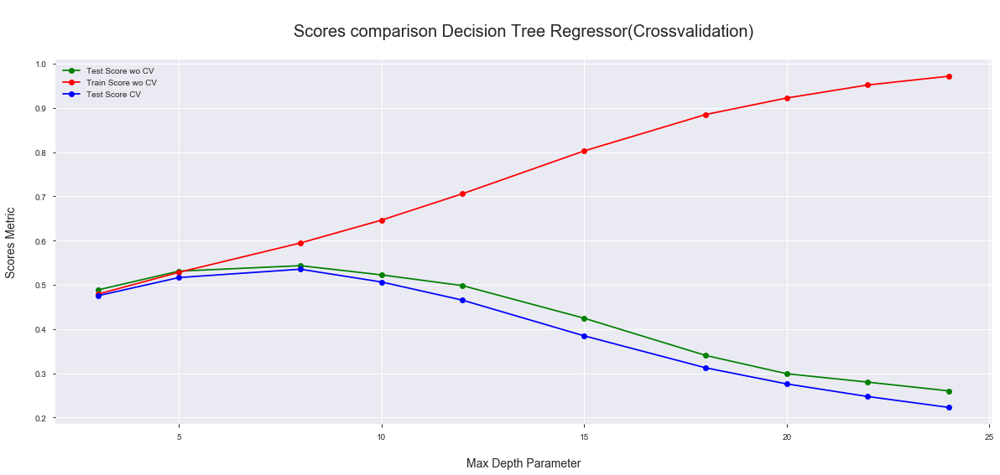

In [19]:
plt.figure(figsize=(20,8))
x_axis = [3,5,8,10,12,15,18,20,22,24]
plt.plot(x_axis, test_score_list, c = 'g', label = 'Test Score wo CV',marker='o')
plt.plot(x_axis, train_score_list, c = 'r', label = 'Train Score wo CV',marker='o')
plt.plot(x_axis, cross_score_list, c = 'b', label = 'Test Score CV ',marker='o')
#plt.annotate("Best score",fontsize=16,xy=(10, 0.5626008),xytext=(12, 0.560), arrowprops=dict(arrowstyle="-|>",connectionstyle="arc3",facecolor="red",edgecolor="red",linestyle='--',linewidth=2))
plt.legend(loc='best')
plt.title('\nScores comparison Decision Tree Regressor(Crossvalidation)\n',fontsize=20)
plt.xlabel('\nMax Depth Parameter',fontsize=14)
plt.ylabel('Scores Metric\n',fontsize=14)
#plt.xticks(np.arange(0, 21, 1))
plt.show()

Let's take a closer look on the above plot

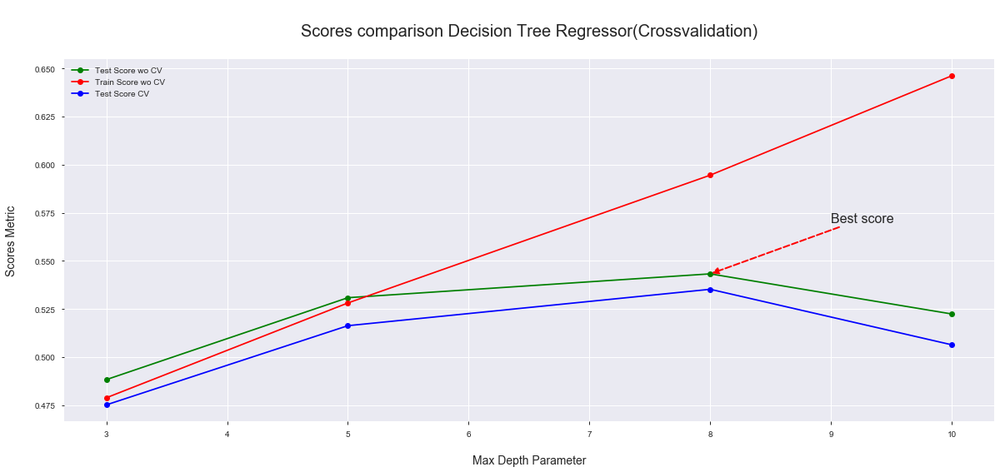

In [21]:
plt.figure(figsize=(20,8))
x_axis = [3,5,8,10]
plt.plot(x_axis, test_score_list[:4], c = 'g', label = 'Test Score wo CV',marker='o')
plt.plot(x_axis, train_score_list[:4], c = 'r', label = 'Train Score wo CV',marker='o')
plt.plot(x_axis, cross_score_list[:4], c = 'b', label = 'Test Score CV ',marker='o')
plt.annotate("Best score",fontsize=16,xy=(8, 0.54327),xytext=(9, 0.570), arrowprops=dict(arrowstyle="-|>",connectionstyle="arc3",facecolor="red",edgecolor="red",linestyle='--',linewidth=2))
plt.legend(loc='best')
plt.title('\nScores comparison Decision Tree Regressor(Crossvalidation)\n',fontsize=20)
plt.xlabel('\nMax Depth Parameter',fontsize=14)
plt.ylabel('Scores Metric\n',fontsize=14)
#plt.xticks(np.arange(0, 21, 1))
plt.show()

<div class="alert alert-block alert-success">Let's visualize the best fitted line by the Decision Tree Regressor Model 

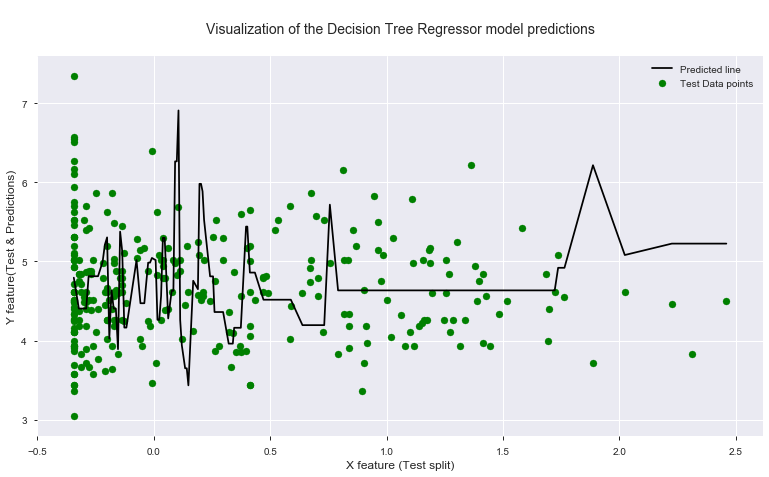

In [20]:
X_b = x_train_sc[:300,234].reshape(-1,1)
y_b = y_train[:300]
dtreet = DecisionTreeRegressor(max_depth=8,random_state=41)
dtreet.fit(X_b, y_b)
cm=pd.DataFrame({'x':x_test_sc[:300,234].tolist(),'y':y_test[:300].tolist()}).sort_values(by='x')
y_predict = dtreet.predict(cm['x'].values.reshape(-1,1))
plt.figure(figsize=(13,7))
plt.plot(cm['x'].tolist(), y_predict, c = 'k',label='Predicted line')
plt.scatter(cm['x'].tolist(), cm['y'].tolist(),label='Test Data points',c='g')
plt.title('\nVisualization of the Decision Tree Regressor model predictions\n',fontsize=14)
plt.xlabel('X feature (Test split)',fontsize=12)
plt.ylabel('Y feature(Test & Predictions)',fontsize=12)
plt.legend()
plt.show()

<div class="alert alert-block alert-info">
<b><font size="5">  Random Forest Regressor  </font></b>

In [16]:
from sklearn.ensemble import RandomForestRegressor

In [19]:
from sklearn.ensemble import RandomForestRegressor
train_score_list = []
test_score_list = []
cross_score_list=[]
for n in [100,200,300]:
    for d in [3,5,8,10,12,15,18,20,22,24]:
        rndtree = RandomForestRegressor(n_estimators=n,max_depth=d,random_state=41,bootstrap=True,n_jobs=-1)#Mean Absolute Error (MAE) criterion.
        scores = cross_val_score(rndtree, x_train, y_train, cv=5)
        print('\nFor max_depth = ',d,' and n_estimators = ',n)
        cross_score_list.append(scores.mean())
        rndtree.fit(x_train,y_train)
        y_pred=rndtree.predict(x_test)
        train_score_list.append(rndtree.score(x_train,y_train))
        test_score_list.append(rndtree.score(x_test, y_test))
        print('\n\t•Training score without Cross validation: ',train_score_list[-1])
        print('\n\t•Cross validation Training score mean:',scores.mean())
        print('\n\t•Testing score without Cross validation: ',test_score_list[-1])
        print(f'\n\t• Root Mean Squared Error: {np.sqrt(mean_squared_error(y_test, y_pred))} \n\n\t• R2 Score: {r2_score(y_test,y_pred)} \n\n\t• Mean Absolute Error: {mean_absolute_error(y_test,y_pred)}')
        print('----------------------------------------------------------------------------')


For max_depth =  3  and n_estimators =  100

	•Training score without Cross validation:  0.4894724783228126

	•Cross validation Training score mean: 0.48492936378030516

	•Testing score without Cross validation:  0.49959039536910554

	• Root Mean Squared Error: 0.4863199993756708 

	• R2 Score: 0.49959039536910554 

	• Mean Absolute Error: 0.35395072029513114
----------------------------------------------------------------------------

For max_depth =  5  and n_estimators =  100

	•Training score without Cross validation:  0.5410350143682545

	•Cross validation Training score mean: 0.5313979238221002

	•Testing score without Cross validation:  0.5444619184489314

	• Root Mean Squared Error: 0.46400392652272865 

	• R2 Score: 0.5444619184489314 

	• Mean Absolute Error: 0.33604166228702304
----------------------------------------------------------------------------

For max_depth =  8  and n_estimators =  100

	•Training score without Cross validation:  0.6179215770457771

	•Cross vali

<div class="alert alert-block alert-success">

From the above results we can see that the Random Forest Regressor model yields the best results when `'max_depth'` is `15` and `'n_estimators'` is `100`, which leads to the best R<sup>2</sup> score of `0.607485` whcih is the maximum score of all the models we  build so far
    <div>

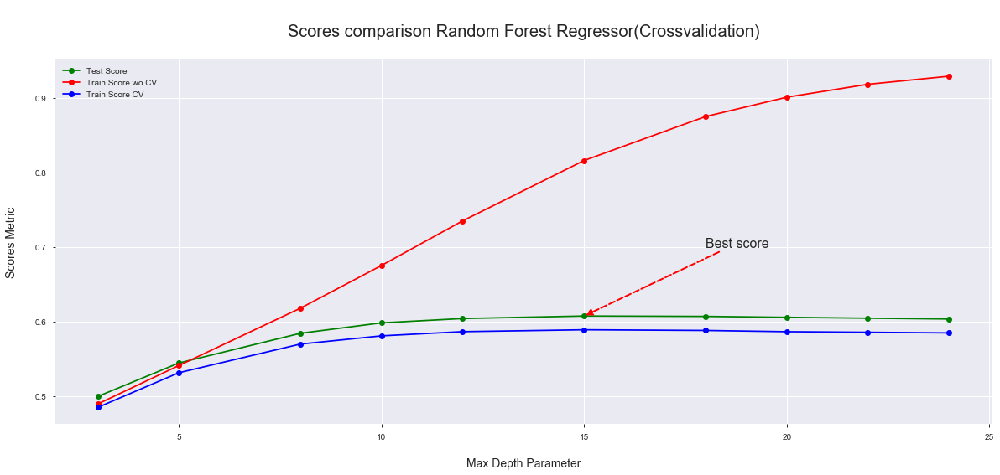

In [25]:
plt.figure(figsize=(20,8))
x_axis =[3,5,8,10,12,15,18,20,22,24]
plt.plot(x_axis, test_score_list[:10], c = 'g', label = 'Test Score',marker='o')
plt.plot(x_axis, train_score_list[:10], c = 'r', label = 'Train Score wo CV',marker='o')
plt.plot(x_axis, cross_score_list[:10], c = 'b', label = 'Train Score CV ',marker='o')
plt.annotate("Best score",fontsize=16,xy=(15, 0.6074857),xytext=(18, 0.70), arrowprops=dict(arrowstyle="-|>",connectionstyle="arc3",facecolor="red",edgecolor="red",linestyle='--',linewidth=2))
plt.legend(loc='best')
plt.title('\nScores comparison Random Forest Regressor(Crossvalidation)\n',fontsize=20)
plt.xlabel('\nMax Depth Parameter',fontsize=14)
plt.ylabel('Scores Metric\n',fontsize=14)
#plt.xticks(np.arange(0, 21, 1))
plt.show()

<div class="alert alert-block alert-success">Let's visualize the best fitted line by the Random Forest Regressor Model 

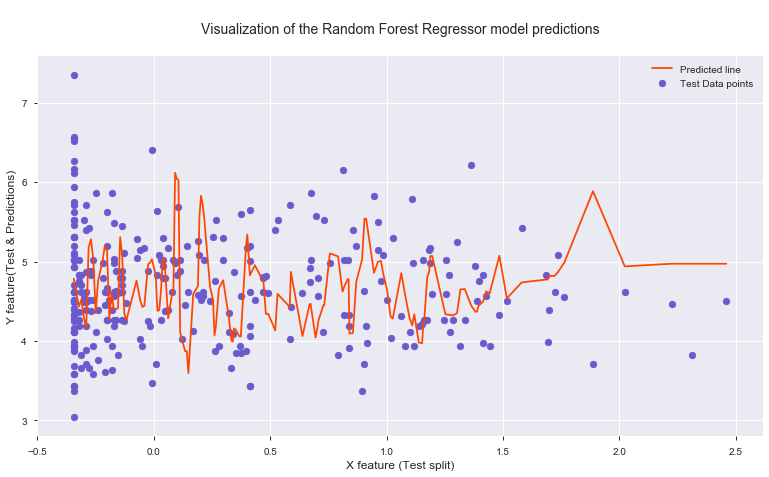

In [17]:
X_b = x_train_sc[:300,234].reshape(-1,1)
y_b = y_train[:300]
rndtreet = RandomForestRegressor(n_estimators=100,max_depth=15,random_state=41,bootstrap=True,n_jobs=-1)#Mean Absolute Error (MAE) criterion.
rndtreet.fit(X_b, y_b)
cm=pd.DataFrame({'x':x_test_sc[:300,234].tolist(),'y':y_test[:300].tolist()}).sort_values(by='x')
y_predict = rndtreet.predict(cm['x'].values.reshape(-1,1))
plt.figure(figsize=(13,7))
plt.plot(cm['x'].tolist(), y_predict, c = 'orangered',label='Predicted line')
plt.scatter(cm['x'].tolist(), cm['y'].tolist(),label='Test Data points',c='slateblue')
plt.title('\nVisualization of the Random Forest Regressor model predictions\n',fontsize=14)
plt.xlabel('X feature (Test split)',fontsize=12)
plt.ylabel('Y feature(Test & Predictions)',fontsize=12)
plt.legend()
plt.show()

<div class="alert alert-block alert-info">
<b><font size="5">  Artificial Neural Network (ANN by using Keras)  </font></b>

In [16]:
# Import `Sequential` from `keras.models`
import keras
from keras.models import Sequential

# Import `Dense` from `keras.layers`
from keras.layers import Dense

Using TensorFlow backend.


<div class="alert alert-block alert-warning">
The optimizer and the loss are two arguments that are required if you want to compile the model.<br><br>
Some of the most popular optimization algorithms used are the Stochastic Gradient Descent (SGD), ADAM and RMSprop<br><br>
 The choice for a loss function depends on the task that you have at hand:   <br>
 •for example, In a regression problem, you’ll usually use the Mean Squared Error (MSE).  <br> 
 •wil be using binary_crossentropy for the binary classification problem     <br>
 •Lastly, with multi-class classification, you’ll make use of categorical_crossentropy.  <br><br>
 
 
 for more info refer the below link:   
 https://machinelearningmastery.com/how-to-choose-loss-functions-when-training-deep-learning-neural-networks/

In [17]:
x_train.shape

(34226, 236)

In [94]:
# Import `Sequential` from `keras.models`
import keras
from keras.models import Sequential
# Import `Dense` from `keras.layers`
from keras.layers import Dense
# Initialize the constructor
ann_model = Sequential()
# Add one input layer and first hidden layer
ann_model.add(Dense(50, activation='sigmoid', kernel_initializer='normal',input_dim=236))

# Add second hidden layer 
ann_model.add(Dense(40, activation='sigmoid',kernel_initializer='normal'))
ann_model.add(Dense(20, activation='sigmoid',kernel_initializer='normal'))
# Add an output layer 
ann_model.add(Dense(1, activation="linear"))

ann_model.compile(loss='mean_squared_error',optimizer='adadelta',metrics=['mse'])

ann_result=ann_model.fit(x_train_sc, y_train,epochs=50, batch_size=20, verbose=1,validation_split=0.15)

Train on 29092 samples, validate on 5134 samples
Epoch 1/50
29092/29092 [==============================] - 8s 266us/step - loss: 0.6150 - mse: 0.6150 - val_loss: 0.2509 - val_mse: 0.2509
Epoch 2/50
29092/29092 [==============================] - 8s 267us/step - loss: 0.2422 - mse: 0.2422 - val_loss: 0.2380 - val_mse: 0.2380
Epoch 3/50
29092/29092 [==============================] - 7s 231us/step - loss: 0.2310 - mse: 0.2310 - val_loss: 0.2348 - val_mse: 0.2348
Epoch 4/50
29092/29092 [==============================] - 7s 242us/step - loss: 0.2272 - mse: 0.2272 - val_loss: 0.2258 - val_mse: 0.2258
Epoch 5/50
29092/29092 [==============================] - 8s 287us/step - loss: 0.2252 - mse: 0.2252 - val_loss: 0.2277 - val_mse: 0.2277
Epoch 6/50
29092/29092 [==============================] - 9s 305us/step - loss: 0.2233 - mse: 0.2233 - val_loss: 0.2228 - val_mse: 0.2228
Epoch 7/50
29092/29092 [==============================] - 9s 303us/step - loss: 0.2225 - mse: 0.2225 - val_loss: 0.2265 - v

In [95]:
score = ann_model.evaluate(x_test_sc, y_test,verbose=1) 
score
#The score is a list that holds the combination of the loss and the accuracy.

14669/14669 [==============================] - 1s 65us/step


[0.19747346729432255, 0.19747348129749298]

In [96]:
y_pred= ann_model.predict(x_test_sc)

In [97]:
print(f'Artificial Neural Network Metrics:\n \n\t• Mean Squared Error: {(mean_squared_error(y_test, y_pred))} \n\n\t• Root Mean Squared Error: {np.sqrt(mean_squared_error(y_test, y_pred))} \n\n\t• R2 Score: {r2_score(y_test,y_pred)} \n\n\t• Mean Absolute Error: {mean_absolute_error(y_test,y_pred)}')

Artificial Neural Network Metrics:
 
	• Mean Squared Error: 0.1974734624325277 

	• Root Mean Squared Error: 0.44437986276667363 

	• R2 Score: 0.5821791405033031 

	• Mean Absolute Error: 0.3252352079425942


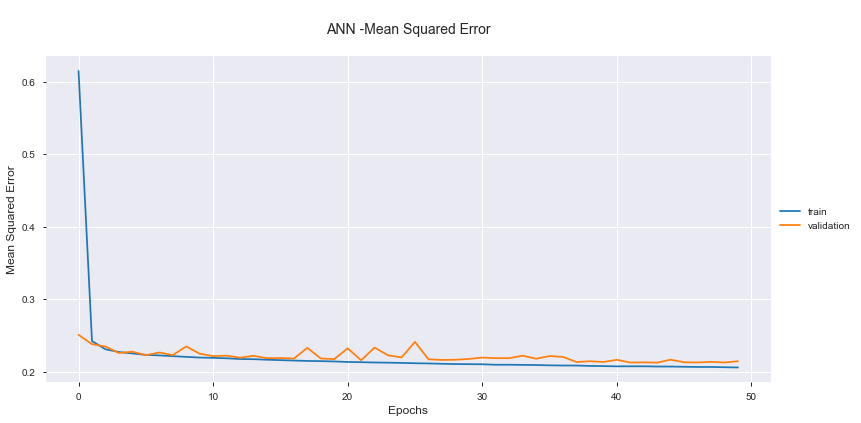

In [104]:
plt.figure(figsize=(13,6))
plt.plot(x, ann_result.history['mse'], label='train')
plt.plot(x, ann_result.history['val_mse'], label='validation')
plt.title('\nANN -Mean Squared Error\n',fontsize=14)
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.xlabel('Epochs',fontsize=12)
plt.ylabel('Mean Squared Error',fontsize=12)
plt.show()

<div class="alert alert-block alert-success">Let's visualize the best fitted line by the Artificial Neural Network Model 

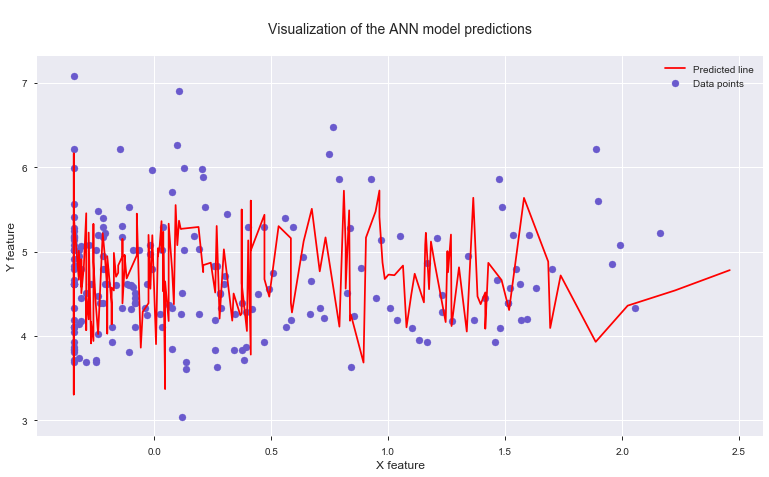

In [135]:
cm=pd.DataFrame({'x':x_test_sc[:200,234].tolist(),'y':y_pred[:200].tolist()}).sort_values(by='x')
plt.figure(figsize=(13,7))
plt.plot(cm['x'].tolist(), cm['y'].tolist(), c = 'red',label='Predicted line')
plt.scatter(x_train_sc[:200,234].reshape(-1,1), y_train[:200],label='Data points',c='slateblue')
plt.title('\nVisualization of the ANN model predictions\n',fontsize=14)
plt.xlabel('X feature',fontsize=12)
plt.ylabel('Y feature',fontsize=12)
plt.legend()
plt.show()

<div class="alert alert-block alert-info">
<b><font size="5">  Polynomial Regression   </font></b>

In [17]:
from  sklearn.preprocessing  import PolynomialFeatures

In [18]:
from  sklearn.preprocessing  import PolynomialFeatures
poly = PolynomialFeatures(degree = 2)
print('Degree initialized')
X_train_poly = poly.fit_transform(x_train[:20000])  #as we dont have enough memeory to create polynomial transformation for 48k rows we are reducing as of now to just get a gesture of whether the model fits the data
print('train set is transormed')
X_test_poly = poly.transform(x_test[:20000])
print('test set is transformed')
from sklearn.linear_model import LinearRegression
lreg = LinearRegression()
print('Linear regression initialized and now fitting')
lreg.fit(X_train_poly, y_train[:20000])
print('model fitted and now predicting')
y_pred=lreg.predict(X_test_poly)
print('Training score',lreg.score(X_train_poly, y_train[:20000]))
print('Testing score',lreg.score(X_test_poly, y_test[:20000]))
print(f'Polynomial Linear Regression Metrics:\n \n\t• Mean Squared Error: {(mean_squared_error(y_test[:20000], y_pred))} \n\n\t• Root Mean Squared Error: {np.sqrt(mean_squared_error(y_test[:20000], y_pred))} \n\n\t• R2 Score: {r2_score(y_test[:20000],y_pred)} \n\n\t• Mean Absolute Error: {mean_absolute_error(y_test[:20000],y_pred)}')

Degree initialized
train set is transormed
test set is transformed
Linear regression initialized and now fitting
model fitted and now predicting
Training score 0.6296534673228664
Testing score -494221579336.88763
Polynomial Linear Regression Metrics:
 
	• Mean Squared Error: 233582513324.7001 

	• Root Mean Squared Error: 483303.7485109133 

	• R2 Score: -494221579336.88763 

	• Mean Absolute Error: 21123.222881359685


<div class="alert alert-block alert-danger">
    
R<sup>2</sup>  is negative only when the chosen model does not follow the trend of the data, so fits worse than a horizontal line.(ie) the relationship between the independent variable and the dependent variable is not a simple linear relationship and it might be a complex linear relationship which cann't be captured by as a simple Linear regression model like as above.<br><br>
A negative R<sup>2</sup> is not a mathematical impossibility or the sign of a computer bug. It simply means that the chosen model (with its constraints) fits the data really poorly.<br><br>

When the test score is relatively poor than the training score , it indicates that the model is suffering from the problem of `over-generalization` or `over-fitting` and it can be eliminated by either `'Ridge'` or `'LASSO'` model which is also known as the Regularized Linear model<div>

<div class="alert alert-block alert-info">
<b><font size="5">Stochastic Gradient Boosting</font></b>

In [16]:
from sklearn.ensemble import GradientBoostingRegressor

In [23]:
from sklearn.ensemble import GradientBoostingRegressor

for l in [0.01,0.04,0.05,0.06,0.07,0.09,0.1]:
    sgb=GradientBoostingRegressor(learning_rate=l,n_estimators=100,
                                  max_depth=15,subsample=0.9,random_state=999
                                  ,max_features='sqrt')
    #scores= cross_val_score(sgb, x_train, y_train, cv=3)
    print('\nFor n_estimator = ',100,' and For maxdepth =',15,'and Learning rate = ',l)
    #print('\nCross validation Testing mean:',scores.mean())
    sgb.fit(x_train,y_train)
    y_pred=sgb.predict(x_test)
    print('\nStochastic Gradient Boosting Metrics:\n\n\t•Training score :'
          ,sgb.score(x_train, y_train))
    print('\n\t•Test score :',sgb.score(x_test, y_test))
    print(f' \n\t• Mean Squared Error: {(mean_squared_error(y_test, y_pred))}
    \n\n\t• Root Mean Squared Error: {np.sqrt(mean_squared_error(y_test, y_pred))}
    \n\n\t• R2 Score: {r2_score(y_test,y_pred)} \n\n\t• 
          Mean Absolute Error: {mean_absolute_error(y_test,y_pred)}')
    print('--------------------------------------------------------------------------')



For n_estimator =  100  and For maxdepth = 15 and Learning rate =  0.01

Stochastic Gradient Boosting Metrics:

	•Training score : 0.5650027713634246

	•Test score : 0.48860589039362246
 
	• Mean Squared Error: 0.2416987165581409 

	• Root Mean Squared Error: 0.4916286368369329 

	• R2 Score: 0.48860589039362246 

	• Mean Absolute Error: 0.36332342439499454
--------------------------------------------------------------------------

For n_estimator =  100  and For maxdepth = 15 and Learning rate =  0.04

Stochastic Gradient Boosting Metrics:

	•Training score : 0.806456007588783

	•Test score : 0.6143479112767483
 
	• Mean Squared Error: 0.18226962949205977 

	• Root Mean Squared Error: 0.42693047383860966 

	• R2 Score: 0.6143479112767483 

	• Mean Absolute Error: 0.30551079827108085
--------------------------------------------------------------------------

For n_estimator =  100  and For maxdepth = 15 and Learning rate =  0.05

Stochastic Gradient Boosting Metrics:

	•Training score

<div class="alert alert-block alert-success">

From above we can see that the Gradient boosting yields best results at `learning_rate=0.05` 

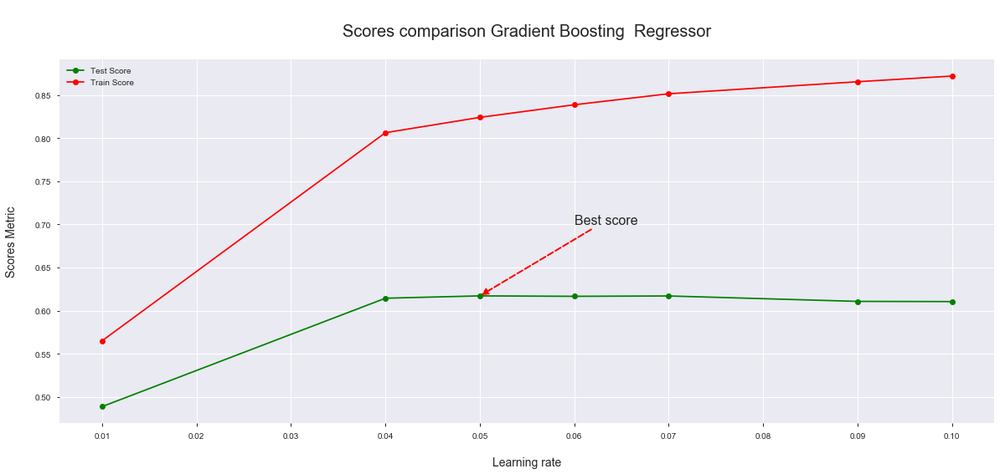

In [29]:
plt.figure(figsize=(20,8))
x_axis =[0.01,0.04,0.05,0.06,0.07,0.09,0.1]
plt.plot(x_axis, [0.4886058,0.6143479,0.617079,0.616562,0.616974,0.610685,0.6104595], c = 'g', label = 'Test Score',marker='o')
plt.plot(x_axis, [0.5650027,0.806456,0.8242347,0.838891,0.851644,0.86561,0.8722], c = 'r', label = 'Train Score ',marker='o')
plt.annotate("Best score",fontsize=16,xy=(0.05, 0.617079),xytext=(0.06, 0.70), arrowprops=dict(arrowstyle="-|>",connectionstyle="arc3",facecolor="red",edgecolor="red",linestyle='--',linewidth=2))
plt.legend(loc='best')
plt.title('\nScores comparison Gradient Boosting  Regressor\n',fontsize=20)
plt.xlabel('\nLearning rate',fontsize=14)
plt.ylabel('Scores Metric\n',fontsize=14)
plt.xticks(np.arange(0.01, 0.11, 0.01))
plt.show()

Training with the best parameter

In [31]:
sgb=GradientBoostingRegressor(learning_rate=0.05,n_estimators=100,max_depth=15,subsample=0.9,random_state=999,max_features='sqrt')
#scores= cross_val_score(sgb, x_train, y_train, cv=3)
print('\nFor n_estimator = ',100,' and For maxdepth =',15,'and Learning rate = ',0.05)
#print('\nCross validation Testing mean:',scores.mean())
sgb.fit(x_train,y_train)
y_pred=sgb.predict(x_test)
print('\nStochastic Gradient Boosting Metrics:\n\n\t•Training score :',sgb.score(x_train, y_train))
print('\n\t•Test score :',sgb.score(x_test, y_test))
print(f' \n\t• Mean Squared Error: {(mean_squared_error(y_test, y_pred))} \n\n\t• Root Mean Squared Error: {np.sqrt(mean_squared_error(y_test, y_pred))} \n\n\t• R2 Score: {r2_score(y_test,y_pred)} \n\n\t• Mean Absolute Error: {mean_absolute_error(y_test,y_pred)}')
print('--------------------------------------------------------------------------')



For n_estimator =  100  and For maxdepth = 15 and Learning rate =  0.05

Stochastic Gradient Boosting Metrics:

	•Training score : 0.8242347284439487

	•Test score : 0.6170793867727601
 
	• Mean Squared Error: 0.18097866014123115 

	• Root Mean Squared Error: 0.4254158672889754 

	• R2 Score: 0.6170793867727602 

	• Mean Absolute Error: 0.3037541885692279
--------------------------------------------------------------------------


<div class="alert alert-block alert-success">Let's visualize the best fitted line by the Stochastic Gradient Boosting Model 

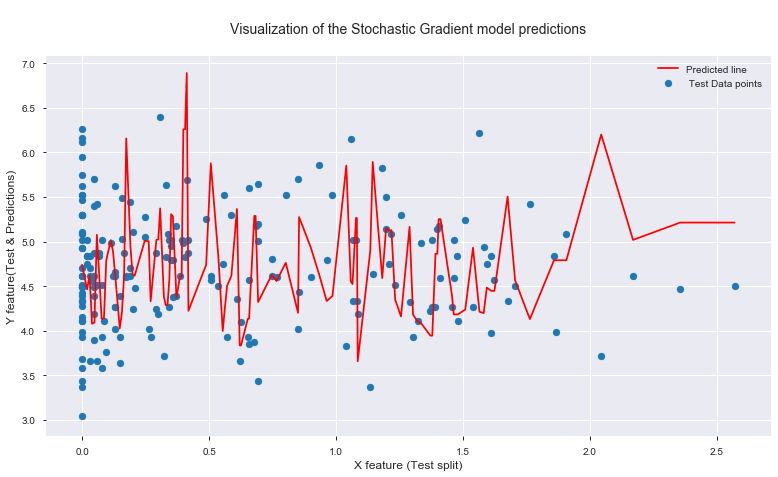

In [41]:
X_b = x_train.values[:200,234].reshape(-1,1)
y_b = y_train[:200]
sgbt=GradientBoostingRegressor(learning_rate=0.05,n_estimators=100,max_depth=15,subsample=0.9,random_state=999,max_features='sqrt')
sgbt.fit(X_b, y_b)
cm=pd.DataFrame({'x':x_test.iloc[:200,234].tolist(),'y':y_test[:200].tolist()}).sort_values(by='x')
y_predict = sgbt.predict(cm['x'].values.reshape(-1,1))
plt.figure(figsize=(13,7))
plt.plot(cm['x'].tolist(), y_predict, c = 'r',label='Predicted line')
plt.scatter(cm['x'].tolist(), cm['y'].tolist(),label=' Test Data points')
plt.title('\nVisualization of the Stochastic Gradient model predictions\n',fontsize=14)
plt.xlabel('X feature (Test split)',fontsize=12)
plt.ylabel('Y feature(Test & Predictions)',fontsize=12)
plt.legend()
plt.show()

<div class="alert alert-block alert-info">
<b><font size="5">  Unsupervised Model : K Means Clustering   </font></b>

<div class="alert alert-block alert-warning">
Now, we will try to find the optimal number of clusters to classify the dataset(to make a structure out of it) by using K Means algorithm

In [3]:
from sklearn.preprocessing import LabelEncoder

In [4]:
df.head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,2539,Clean & quiet apt home by the park,2787,John,Brooklyn,Kensington,40.64749,-73.97237,Private room,149,1,9,2018-10-19,0.21,6,365
1,2595,Skylit Midtown Castle,2845,Jennifer,Manhattan,Midtown,40.75362,-73.98377,Entire home/apt,225,1,45,2019-05-21,0.38,2,355
2,3647,THE VILLAGE OF HARLEM....NEW YORK !,4632,Elisabeth,Manhattan,Harlem,40.80902,-73.94190,Private room,150,3,0,NaN,NaN,1,365
3,3831,Cozy Entire Floor of Brownstone,4869,LisaRoxanne,Brooklyn,Clinton Hill,40.68514,-73.95976,Entire home/apt,89,1,270,2019-07-05,4.64,1,194
4,5022,Entire Apt: Spacious Studio/Loft by central park,7192,Laura,Manhattan,East Harlem,40.79851,-73.94399,Entire home/apt,80,10,9,2018-11-19,0.10,1,0


In [5]:
kdf=df.drop(['id', 'name', 'host_id', 'host_name','last_review','number_of_reviews'],axis=1)

In [6]:
kdf['reviews_per_month'].fillna(0,inplace=True)

In [7]:
kdf.isnull().sum()

neighbourhood_group               0
neighbourhood                     0
latitude                          0
longitude                         0
room_type                         0
price                             0
minimum_nights                    0
reviews_per_month                 0
calculated_host_listings_count    0
availability_365                  0
dtype: int64

In [8]:
le=LabelEncoder()

In [9]:
kdf['neighbourhood_group']= le.fit_transform(kdf['neighbourhood_group'])
kdf['neighbourhood']= le.fit_transform(kdf['neighbourhood'])
kdf['room_type']= le.fit_transform(kdf['room_type'])

In [10]:
kdf.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48895 entries, 0 to 48894
Data columns (total 10 columns):
neighbourhood_group               48895 non-null int32
neighbourhood                     48895 non-null int32
latitude                          48895 non-null float64
longitude                         48895 non-null float64
room_type                         48895 non-null int32
price                             48895 non-null int64
minimum_nights                    48895 non-null int64
reviews_per_month                 48895 non-null float64
calculated_host_listings_count    48895 non-null int64
availability_365                  48895 non-null int64
dtypes: float64(3), int32(3), int64(4)
memory usage: 3.2 MB


<div class="alert alert-block alert-success">
Let's find the sutiable number of clusters by using K-means algorithm

In [14]:
from sklearn.cluster import KMeans 
wcss=[]   #within cluster sum of squares
for k in range(1,11):
    kmc=KMeans(n_clusters=k,random_state=42)
    kmc.fit(kdf)
    wcss.append(kmc.inertia_)

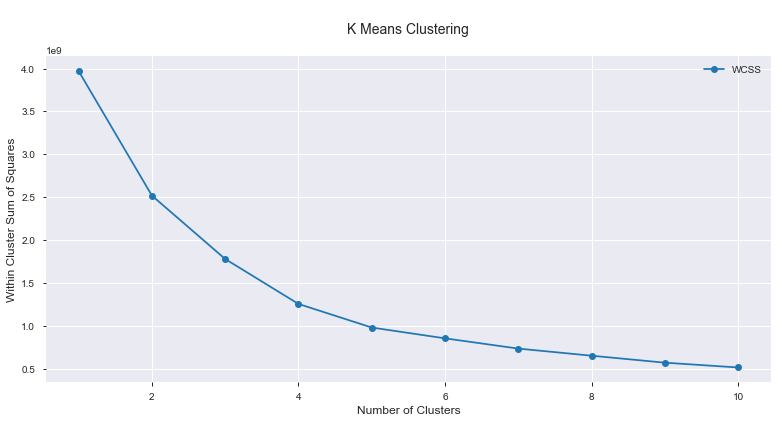

In [20]:
plt.figure(figsize=(13,6))
plt.plot(range(1,11),wcss, label='WCSS',marker='o')
plt.title('\nK Means Clustering\n',fontsize=14)
plt.legend(loc='top right')
plt.xlabel('Number of Clusters',fontsize=12)
plt.ylabel('Within Cluster Sum of Squares',fontsize=12)
plt.annotate("Optimal cluster",fontsize=16,xy=(5,1),xytext=(6.5, 1.5), arrowprops=dict(arrowstyle="-|>",connectionstyle="arc3",facecolor="red",edgecolor="red",linestyle='--',linewidth=2))

plt.show()

Training with the optimal cluster

In [22]:
kmc=KMeans(n_clusters=5,random_state=42)
kmc.fit(kdf)
y_kmeans=kmc.fit_predict(kdf)

In [23]:
y_kmeans

array([3, 3, 3, ..., 0, 0, 0])

In [24]:
tot=pd.concat([kdf,pd.DataFrame(y_kmeans,columns=['y_kmeans'])],axis=1)

In [25]:
tot.head()

,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,reviews_per_month,calculated_host_listings_count,availability_365,y_kmeans
0,1,108,40.64749,-73.97237,1,149,1,0.21,6,365,3
1,2,127,40.75362,-73.98377,0,225,1,0.38,2,355,3
2,2,94,40.80902,-73.94190,1,150,3,0.00,1,365,3
3,1,41,40.68514,-73.95976,0,89,1,4.64,1,194,3
4,2,61,40.79851,-73.94399,0,80,10,0.10,1,0,0


In [26]:
tot['y_kmeans'].value_counts()

0    30832
3    15118
2     2771
4      148
1       26
Name: y_kmeans, dtype: int64

Let's Visualize how the clusters has been created based on each features

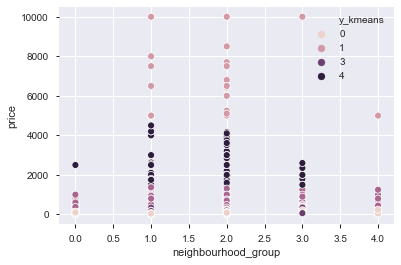

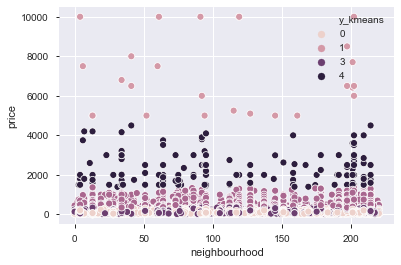

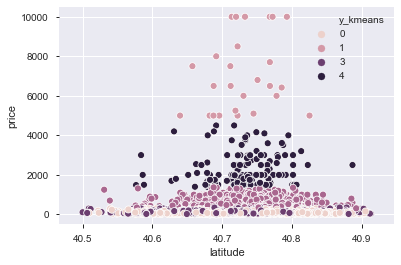

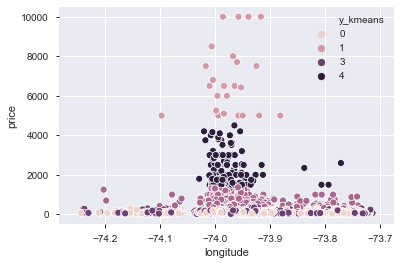

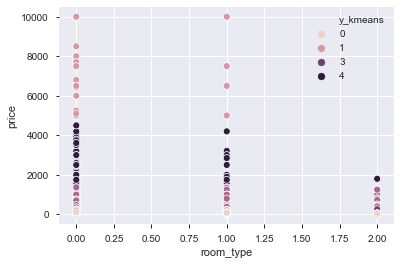

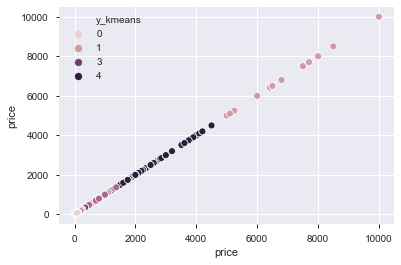

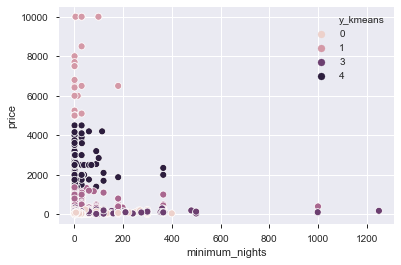

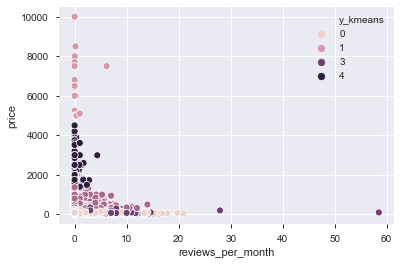

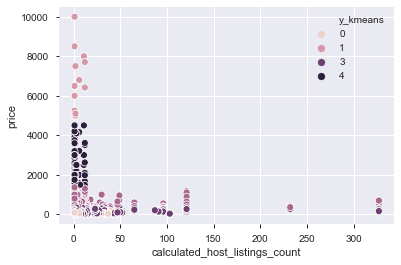

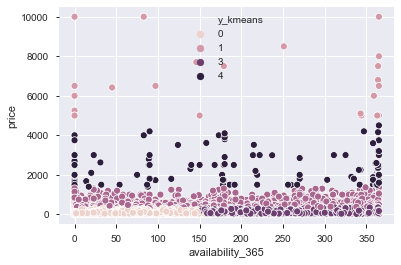

In [40]:
for col in kdf.columns:
    sns.scatterplot(tot[col],tot['price'],hue=tot['y_kmeans'])
    plt.show()

<div class="alert alert-block alert-success">From above we can see that we can see some clear boundaries for the clusters only for the 'availability_365' and 'price'

In [27]:
tot['y_kmeans'].value_counts()

0    30832
3    15118
2     2771
4      148
1       26
Name: y_kmeans, dtype: int64

In [28]:
tot['y_kmeans']= tot['y_kmeans']+1  #changing from '0 to 4' to '1 to 5'

In [30]:
tot['y_kmeans'].value_counts()

1    30832
4    15118
3     2771
5      148
2       26
Name: y_kmeans, dtype: int64

In [31]:
tot['y_kmeans']= tot['y_kmeans'].astype('object')

In [32]:
tot.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48895 entries, 0 to 48894
Data columns (total 11 columns):
neighbourhood_group               48895 non-null int32
neighbourhood                     48895 non-null int32
latitude                          48895 non-null float64
longitude                         48895 non-null float64
room_type                         48895 non-null int32
price                             48895 non-null int64
minimum_nights                    48895 non-null int64
reviews_per_month                 48895 non-null float64
calculated_host_listings_count    48895 non-null int64
availability_365                  48895 non-null int64
y_kmeans                          48895 non-null object
dtypes: float64(3), int32(3), int64(4), object(1)
memory usage: 3.5+ MB


In [33]:
tot['y_kmeans'].value_counts()

1    30832
4    15118
3     2771
5      148
2       26
Name: y_kmeans, dtype: int64

<Figure size 1080x864 with 0 Axes>

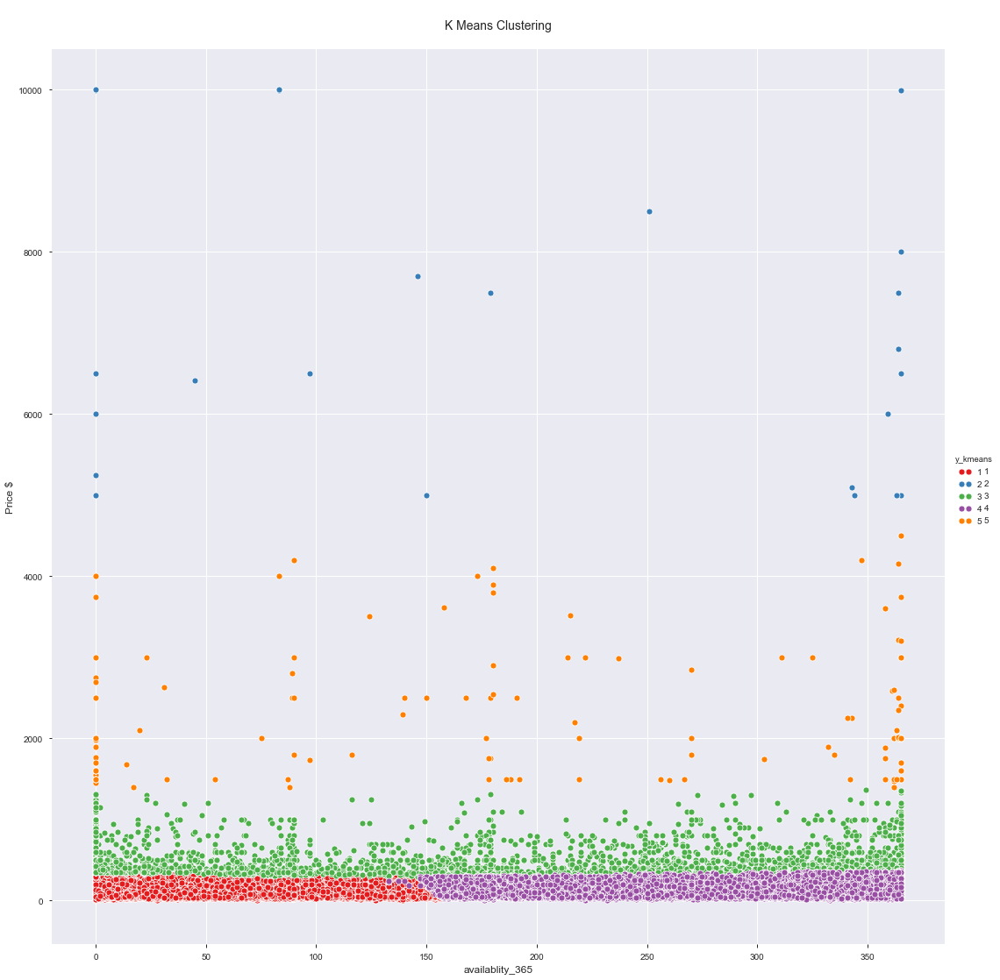

In [56]:
plt.figure(figsize=(15,12))
sns.pairplot(x_vars='availability_365',y_vars='price',hue='y_kmeans',data=tot,palette='Set1',size=15)
plt.title('\nK Means Clustering\n',fontsize=14)
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.xlabel('availablity_365',fontsize=12)
plt.ylabel('Price $',fontsize=12)
plt.show()


<div class="alert alert-block alert-success">  

In the above plot we can see that the :<br><br>

• Cluster 1  is formed where we have availability less than 150 days and price ranges 0 to 400 dollars<br><br>
• Cluster 2 is having all the availability and price ranges between 5000 to 10000 dollars<br><br>
• Cluster 3 is having all the availability  and price ranges 400 to 1400 dollars<br><br>
• Cluster 4 is having availability more than 150 days and price ranges 0 to 400 dollars<br><br>
• Cluster 5 is having all the availability  and price ranges 1400 to 5000 dollars<br><br>

<div class="alert alert-block alert-warning"> 
Let's see the properties of each cluster based on each Features by using groupby and describe function

In [59]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
display(tot.groupby(['y_kmeans']).describe().transpose())

y_kmeans                                         1             2            3  \
neighbourhood_group            count  30832.000000     26.000000  2771.000000   
                               mean       1.632784      1.846154     1.784554   
                               std        0.711608      0.674822     0.509965   
                               min        0.000000      1.000000     0.000000   
                               25%        1.000000      1.250000     2.000000   
                               50%        2.000000      2.000000     2.000000   
                               75%        2.000000      2.000000     2.000000   
                               max        4.000000      4.000000     4.000000   
neighbourhood                  count  30832.000000     26.000000  2771.000000   
                               mean     107.976453    107.307692   122.220859   
                               std       69.990736     71.156037    62.204457   
                               min        0.000000      4.000000     0.000000   
                               25%       51.000000     43.750000    73.000000   
                               50%       94.000000    104.500000   127.000000   
                               75%      185.000000    188.000000   191.000000   
                               max      220.000000    202.000000   220.000000   
latitude                       count  30832.000000     26.000000  2771.000000   
                               mean      40.729022     40.729873    40.736155   
                               std        0.053798      0.044031     0.038880   
                               min       40.509430     40.639520    40.530760   
                               25%       40.690670     40.699695    40.715795   
                               50%       40.721515     40.721950    40.737950   
                               75%       40.763542     40.768205    40.761125   
                               max       40.907340     40.825110    40.893380   
longitude                      count  30832.000000     26.000000  2771.000000   
                               mean     -73.953007    -73.973628   -73.974525   
                               std        0.041393      0.041383     0.034175   
                               min      -74.244420    -74.097300   -74.202950   
                               25%      -73.981510    -73.995163   -73.994670   
                               50%      -73.955110    -73.981075   -73.981370   
                               75%      -73.938030    -73.953852   -73.962275   
                               max      -73.717950    -73.881280   -73.738740   
room_type                      count  30832.000000     26.000000  2771.000000   
                               mean       0.525396      0.192308     0.118008   
                               std        0.538008      0.401918     0.345372   
                               min        0.000000      0.000000     0.000000   
                               25%        0.000000      0.000000     0.000000   
                               50%        1.000000      0.000000     0.000000   
                               75%        1.000000      0.000000     0.000000   
                               max        2.000000      1.000000     2.000000   
price                          count  30832.000000     26.000000  2771.000000   
                               mean     115.938311   7087.269231   515.606279   
                               std       64.733563   1916.541250   198.006423   
                               min        0.000000   5000.000000   295.000000   
                               25%       65.000000   5137.500000   378.500000   
                               50%      100.000000   6500.000000   450.000000   
                               75%      150.000000   8375.000000   599.000000   
                               max      345.000000  10000.000000  1369.000000   
minimum_nights                 

In [60]:
rescluster=pd.DataFrame(tot.groupby(['y_kmeans']).describe().transpose())

In [61]:
rescluster

y_kmeans                                         1             2            3  \
neighbourhood_group            count  30832.000000     26.000000  2771.000000   
                               mean       1.632784      1.846154     1.784554   
                               std        0.711608      0.674822     0.509965   
                               min        0.000000      1.000000     0.000000   
                               25%        1.000000      1.250000     2.000000   
                               50%        2.000000      2.000000     2.000000   
                               75%        2.000000      2.000000     2.000000   
                               max        4.000000      4.000000     4.000000   
neighbourhood                  count  30832.000000     26.000000  2771.000000   
                               mean     107.976453    107.307692   122.220859   
                               std       69.990736     71.156037    62.204457   
                               min        0.000000      4.000000     0.000000   
                               25%       51.000000     43.750000    73.000000   
                               50%       94.000000    104.500000   127.000000   
                               75%      185.000000    188.000000   191.000000   
                               max      220.000000    202.000000   220.000000   
latitude                       count  30832.000000     26.000000  2771.000000   
                               mean      40.729022     40.729873    40.736155   
                               std        0.053798      0.044031     0.038880   
                               min       40.509430     40.639520    40.530760   
                               25%       40.690670     40.699695    40.715795   
                               50%       40.721515     40.721950    40.737950   
                               75%       40.763542     40.768205    40.761125   
                               max       40.907340     40.825110    40.893380   
longitude                      count  30832.000000     26.000000  2771.000000   
                               mean     -73.953007    -73.973628   -73.974525   
                               std        0.041393      0.041383     0.034175   
                               min      -74.244420    -74.097300   -74.202950   
                               25%      -73.981510    -73.995163   -73.994670   
                               50%      -73.955110    -73.981075   -73.981370   
                               75%      -73.938030    -73.953852   -73.962275   
                               max      -73.717950    -73.881280   -73.738740   
room_type                      count  30832.000000     26.000000  2771.000000   
                               mean       0.525396      0.192308     0.118008   
                               std        0.538008      0.401918     0.345372   
                               min        0.000000      0.000000     0.000000   
                               25%        0.000000      0.000000     0.000000   
                               50%        1.000000      0.000000     0.000000   
                               75%        1.000000      0.000000     0.000000   
                               max        2.000000      1.000000     2.000000   
price                          count  30832.000000     26.000000  2771.000000   
                               mean     115.938311   7087.269231   515.606279   
                               std       64.733563   1916.541250   198.006423   
                               min        0.000000   5000.000000   295.000000   
                               25%       65.000000   5137.500000   378.500000   
                               50%      100.000000   6500.000000   450.000000   
                               75%      150.000000   8375.000000   599.000000   
                               max      345.000000  10000.000000  1369.000000   
minimum_nights                 

<div class="alert alert-block alert-success"> 
The above table concludes the basic properties of each cluster in the dataset numerically whcih is same as the Cluster visualization above